In [1]:
from typing import Union
from urllib.parse import unquote, quote
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
from rdkit import Chem
from rdkit.Chem import inchi
from rdkit.Chem.MolStandardize import rdMolStandardize
import pickle
from mordred import Calculator, descriptors
from rdkit.Chem.rdMolDescriptors import GetMorganFingerprintAsBitVect
from sklearn.feature_selection import VarianceThreshold
from itertools import compress
from rdkit import Chem
from rdkit import DataStructs
from rdkit.Chem.Fingerprints import FingerprintMols
from rdkit.Chem import AllChem
from rdkit.Chem import Descriptors as Descriptors
import os
from rdkit import Chem
from rdkit import RDPaths
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw
from rdkit.Chem.Draw import rdMolDraw2D
from rdkit.Chem.Draw import MolDraw2DSVG

from bokeh.plotting import ColumnDataSource, figure, output_file, show
from sklearn.decomposition import PCA
from bokeh.io import output_notebook

from molvs import standardize_smiles
import pandas as pd
from rdkit.Chem import inchi
from rdkit import Chem

import shap
shap.initjs()

def standardized_smiles(value):
    #print(value)
    try: return standardize_smiles(value)
    except: return "Cannot_do"
    
def MorganFingerprint(s):
    x = Chem.MolFromSmiles(s)
    return (AllChem.GetMorganFingerprintAsBitVect(x,2,2048))


def MACCSKeysFingerprint(s):
    x = Chem.MolFromSmiles(s)
    return (AllChem.GetMACCSKeysFingerprint(x))

def get_num_charged_atoms_neg(mol):
    mol_h = Chem.AddHs(mol)
    Chem.rdPartialCharges.ComputeGasteigerCharges(mol_h)
     
    positive = 0
    negative = 0
     
    for atom in mol_h.GetAtoms():
        if float(atom.GetProp('_GasteigerCharge')) <= 0:
            negative += 1
     
    return negative

def get_num_charged_atoms_pos(mol):
    mol_h = Chem.AddHs(mol)
    Chem.rdPartialCharges.ComputeGasteigerCharges(mol_h)
     
    positive = 0
    negative = 0
     
    for atom in mol_h.GetAtoms():
        if float(atom.GetProp('_GasteigerCharge')) >= 0:
            positive += 1
    return positive

def get_assembled_ring(mol):
    ring_info = mol.GetRingInfo()
    num_ring = ring_info.NumRings()
    ring_atoms = ring_info.AtomRings()
    num_assembled = 0
     
    for i in range(num_ring):
        for j in range(i+1, num_ring):
            x = set(ring_atoms[i])
            y = set(ring_atoms[j])
            if not x.intersection(y): # 2つの環が縮環でない場合に
                for x_id in x:
                    x_atom = mol.GetAtomWithIdx(x_id)
                    neighbors = [k.GetIdx() for k in x_atom.GetNeighbors()]
                    for x_n in neighbors:
                        if x_n in y: # 環同士を繋ぐ結合があるか否か
                            num_assembled += 1
     
    return num_assembled

def get_num_stereocenters(mol):
    return AllChem.CalcNumAtomStereoCenters(mol) + AllChem.CalcNumUnspecifiedAtomStereoCenters(mol)

def calc_descriptors(dataframe):
    mols = dataframe.smiles_r.apply(Chem.MolFromSmiles)
    #mols_fps=[AllChem.GetMorganFingerprintAsBitVect(x,2) for x in mols]
    descr = []
    for m in mols:
        descr.append([Descriptors.TPSA(m),
               Descriptors.NumRotatableBonds(m),
               AllChem.CalcNumRings(m),
               Descriptors.NumAromaticRings(m),
               Descriptors.NumHAcceptors(m),
               Descriptors.NumHDonors(m),
               Descriptors.FractionCSP3(m),
               Descriptors.MolLogP(m) ,
               Descriptors.NHOHCount(m),
               Descriptors.NOCount(m),
               Descriptors.NumHeteroatoms(m),
               get_num_charged_atoms_pos(m),
               get_num_charged_atoms_neg(m),
               get_assembled_ring(m),
               get_num_stereocenters(m)])
    descr = np.asarray(descr)
    return(descr)

descs = [ 'PSA', 'n_rot_bonds', 'n_rings', 'n_ar_rings',
         'n_HBA', 'n_HBD', 'Fsp3', 'logP', 'NHOHCount', 'NOCount', 'NumHeteroatoms',
        'n_positive', '_n_negative', 'n_ring_asmbl', 'n_stereo']

def calc_all_fp_desc(data):
   
    calc = Calculator(descriptors, ignore_3D=True)
    print(len(calc.descriptors))
    Ser_Mol = data['smiles_r'].apply(Chem.MolFromSmiles)
    # as pandas
    Mordred_table=  calc.pandas(Ser_Mol)
    Mordred_table = Mordred_table.astype('float')
    #Mordred_table['smiles_r'] = model_tox_data['smiles_r']
    
    MACCSfingerprint_array = np.stack(data['smiles_r'].apply(MACCSKeysFingerprint))
    MACCS_collection = []
    for x in np.arange(MACCSfingerprint_array.shape[1]):
        x = "MACCS"+str(x)
        MACCS_collection.append(x)
    MACCSfingerprint_table = pd.DataFrame(MACCSfingerprint_array, columns=MACCS_collection)


    MorganFingerprint_array = np.stack(data['smiles_r'].apply(MorganFingerprint))
    Morgan_fingerprint_collection = []
    for x in np.arange(MorganFingerprint_array.shape[1]):
        x = "Mfp"+str(x)
        Morgan_fingerprint_collection.append(x)
    Morgan_fingerprint_table = pd.DataFrame(MorganFingerprint_array, columns=Morgan_fingerprint_collection)

    
    a=calc_descriptors(data)
    descdf=pd.DataFrame(a, columns=descs)
    descdf_approved=descdf.reset_index(drop=True)
    descdf_approved
    
    tox_model_data= pd.concat([data, Morgan_fingerprint_table, MACCSfingerprint_table, descdf_approved, Mordred_table], axis=1)
    tox_model_data
    
    return(tox_model_data)
    
    
liv_data = [ "2",  "3",  "5",  "6",  "7",  "8",   "10", "11", "14", "15", "16"]

def predict_individual_liv_data(data_dummy, features, endpoint):#predict animal data
    
    loaded_rf = pickle.load(open(f"bestlivmodel_{endpoint}_model.sav", 'rb'))
    X = data_dummy[features]
    X = X.values
    y_proba =  loaded_rf.predict_proba(X)[:,1]  
    
    return(y_proba)

def predict_individual_cmax_data(data_dummy, features, endpoint):#predict animal data
    
    regressor = pickle.load(open(f"bestlivmodel_{endpoint}_model.sav", 'rb'))

    X = data_dummy[features]
    X = X.values
    #Add predictions to held out test set dili
    y_pred = regressor.predict(X)
    
    return(y_pred)

def predict_liv_all(data):
    #Read columns needed for rat data
    file = open(f"./features_morgan_mordred_maccs_physc.txt", "r")
    file_lines = file.read()
    features = file_lines.split("\n")
    features = features[:-1]
    
    data_dummy = data

    for endpoint in liv_data:
        #print(endpoint)
        y_proba = predict_individual_liv_data(data_dummy, features, endpoint) 
        data[endpoint] = y_proba
        
    for endpoint in ["median pMolar unbound plasma concentration" ,
               "median pMolar total plasma concentration"]:
        y_proba = predict_individual_cmax_data(data_dummy, features, endpoint) 
        data[endpoint] = y_proba
    
    return(data)


def predict_DILI(data):#log human_VDss_L_kg model
    
    #Read columns needed for rat data
    file = open(f"./features_morgan_mordred_maccs_physc.txt", "r")
    file_lines = file.read()
    features = file_lines.split("\n")
    features = features[:-1]
    
    features = list(features) + ["median pMolar unbound plasma concentration", "median pMolar total plasma concentration"] + list(liv_data) 
    loaded_rf = pickle.load(open("./final_dili_model.sav", 'rb'))
    #Note this mode was trained on all data before releasing (not just ncv data)

    X = data[features]
    y_proba =  loaded_rf.predict_proba(X)[:,1]
    best_thresh = 0.612911
    print('Best Threshold=%f' % (best_thresh))
    
    y_pred  = [ 1 if y_proba>best_thresh  else 0] 
    
    explainer = shap.TreeExplainer(loaded_rf)
    shap_values = explainer.shap_values(X)
    

    shap.force_plot(explainer.expected_value[1], 
    shap_values[1], X.iloc[0],
    matplotlib=True)
    
    
    flat_shaplist = [item for sublist in shap_values[1] for item in sublist]
    
    interpret = pd.DataFrame()
    interpret["name"] = features
    interpret["SHAP"] = flat_shaplist#print(flat_shaplist)
    plt.show()
    # Explaining the 4th instance

    return(interpret, y_proba, y_pred)


def mol2svg(mol):
    d2d = rdMolDraw2D.MolDraw2DSVG(200, 100)
    d2d.DrawMolecule(mol)
    d2d.FinishDrawing()
    return d2d.GetDrawingText()


    

In [2]:
DILIdata= pd.read_csv("Test_data_DILIst_1275.csv")
DILIdata

,smiles_r,TOXICITY,Source_rank,Source,Data,Mfp0,Mfp1,Mfp2,Mfp3,Mfp4,...,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb2
0,CCN(CC)c1cc(C)nc2ncnn12,1,1,DILIst Classification,DILI,0,0,0,0,1,...,6.605298,9.602585,60.727536,205.132745,6.837758,338.0,22.0,76.0,90.0,3.500000
1,CCN(CC)CC(=O)Oc1ccc(NC(C)=O)cc1,1,1,DILIst Classification,DILI,0,0,0,0,0,...,0.000000,9.339525,51.036465,264.147393,6.773010,844.0,23.0,86.0,93.0,4.500000
2,CCN(CC)Cc1cc(Nc2ccnc3cc(Cl)ccc23)ccc1O,1,1,DILIst Classification,DILI,0,0,0,0,0,...,0.000000,10.080168,59.651481,355.145140,7.556280,1580.0,39.0,128.0,149.0,5.666667
3,CCN(CC)CCCC(C)Nc1ccnc2cc(Cl)ccc12,1,1,DILIst Classification Oral,DILI,0,1,0,0,0,...,0.000000,9.773777,55.480289,319.181526,6.649615,1212.0,31.0,106.0,120.0,5.138889
4,CCN(CC)CCN1C(=O)CN=C(c2ccccc2F)c2cc(Cl)ccc21,1,1,DILIst Classification Oral,DILI,0,0,0,0,0,...,5.379897,10.168118,70.135184,387.151368,7.743027,1747.0,48.0,138.0,163.0,6.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1270,O=C(N[C@@H](CO)[C@H](O)c1ccc([N+](=O)[O-])cc1)...,0,13,DILIrank dataset CP Overlap REpsilber,DILI,0,1,0,0,0,...,0.000000,9.625162,52.858564,322.012327,10.062885,880.0,29.0,94.0,106.0,4.611111
1271,C[C@H]1O[C@@H](O[C@H]2[C@@H](O)C[C@H](O[C@H]3[...,0,13,DILIrank dataset CP Overlap REpsilber,DILI,0,0,0,0,0,...,7.661527,11.357733,111.062995,780.429607,6.558232,14940.0,113.0,320.0,399.0,11.368056
1272,C=C1/C(=C\C=C2/CCC[C@@]3(C)[C@H]2CC[C@@H]3[C@H...,0,13,DILIrank dataset CP Overlap REpsilber,DILI,0,1,0,0,0,...,7.065613,10.448280,80.333949,416.329045,5.626068,2677.0,49.0,160.0,188.0,6.361111
1273,CCC(=O)NCC[C@@H]1CCc2ccc3c(c21)CCO3,0,13,DILIrank dataset CP Overlap REpsilber,DILI,0,0,0,0,0,...,7.423568,9.845488,68.245058,259.157229,6.478931,735.0,27.0,100.0,119.0,4.277778


In [3]:
literature = pd.read_csv("literature.csv")
literature['smiles_r']=literature['smiles'].apply(standardized_smiles)
literature

,name,smiles,smiles_r
0,2-Butoxyethanol,CCCCOCCO,CCCCOCCO
1,Acitretin,COc1cc(C)c(/C=C/C(C)=C/C=C/C(C)=C/C(=O)O)c(C)c1C,COc1cc(C)c(/C=C/C(C)=C/C=C/C(C)=C/C(=O)O)c(C)c1C
2,Alpidem,CCCN(CCC)C(=O)CC1=C(N=C2C=CC(Cl)=CN12)C1=CC=C(...,CCCN(CCC)C(=O)Cc1c(-c2ccc(Cl)cc2)nc2ccc(Cl)cn12
3,Amiodarone,CCCCC1=C(C(=O)C2=CC(I)=C(OCCN(CC)CC)C(I)=C2)C2...,CCCCc1oc2ccccc2c1C(=O)c1cc(I)c(OCCN(CC)CC)c(I)c1
4,Astaxanthin,O=C2\C(=C(\C=C\C(=C\C=C\C(=C\C=C\C=C(\C=C\C=C(...,CC1=C(/C=C/C(C)=C/C=C/C(C)=C/C=C/C=C(C)/C=C/C=...
5,Benzbromarone,CCC1=C(C(=O)C2=CC(Br)=C(O)C(Br)=C2)C2=CC=CC=C2O1,CCc1oc2ccccc2c1C(=O)c1cc(Br)c(O)c(Br)c1
6,Bromfenac,NC1=C(CC(O)=O)C=CC=C1C(=O)C1=CC=C(Br)C=C1,Nc1c(CC(=O)O)cccc1C(=O)c1ccc(Br)cc1
7,Cabazitaxel,CO[C@H]1C[C@H]2OC[C@@]2(OC(C)=O)[C@H]2[C@H](OC...,CO[C@H]1C(=O)[C@]2(C)[C@@H](OC)C[C@H]3OC[C@@]3...
8,Clomiphene,CCN(CC)CCOC1=CC=C(C=C1)C(=C(Cl)C1=CC=CC=C1)C1=...,CCN(CC)CCOc1ccc(C(=C(Cl)c2ccccc2)c2ccccc2)cc1
9,Clopidogrel,COC(=O)[C@@H](N1CCC2=C(C1)C=CS2)C1=CC=CC=C1Cl,COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1


In [4]:
literature = literature[~literature.smiles_r.isin(DILIdata.smiles_r.to_list())]
literature

,name,smiles,smiles_r
0,2-Butoxyethanol,CCCCOCCO,CCCCOCCO
1,Acitretin,COc1cc(C)c(/C=C/C(C)=C/C=C/C(C)=C/C(=O)O)c(C)c1C,COc1cc(C)c(/C=C/C(C)=C/C=C/C(C)=C/C(=O)O)c(C)c1C
4,Astaxanthin,O=C2\C(=C(\C=C\C(=C\C=C\C(=C\C=C\C=C(\C=C\C=C(...,CC1=C(/C=C/C(C)=C/C=C/C(C)=C/C=C/C=C(C)/C=C/C=...
7,Cabazitaxel,CO[C@H]1C[C@H]2OC[C@@]2(OC(C)=O)[C@H]2[C@H](OC...,CO[C@H]1C(=O)[C@]2(C)[C@@H](OC)C[C@H]3OC[C@@]3...
9,Clopidogrel,COC(=O)[C@@H](N1CCC2=C(C1)C=CS2)C1=CC=CC=C1Cl,COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1
11,Docetaxel,[H][C@@]12C[C@H](O)[C@@]3(C)C(=O)[C@H](O)C4=C(...,CC(=O)O[C@@]12CO[C@@H]1C[C@H](O)[C@@]1(C)C(=O)...
12,Doxycycline,[H][C@@]12[C@@H](C)C3=C(C(O)=CC=C3)C(=O)C1=C(O...,C[C@H]1c2cccc(O)c2C(=O)C2=C(O)[C@]3(O)C(=O)C(C...
13,Entacapone,CCN(CC)C(=O)C(=C\C1=CC(=C(O)C(O)=C1)[N+]([O-])...,CCN(CC)C(=O)/C(C#N)=C/c1cc(O)c(O)c([N+](=O)[O-...
14,Enzalutamide,CNC(=O)c1ccc(N2C(=S)N(c3ccc(C#N)c(C(F)(F)F)c3)...,CNC(=O)c1ccc(N2C(=S)N(c3ccc(C#N)c(C(F)(F)F)c3)...
16,Gemcitabine,NC1=NC(=O)N(C=C1)[C@@H]1O[C@H](CO)[C@@H](O)C1(F)F,Nc1ccn([C@@H]2O[C@H](CO)[C@@H](O)C2(F)F)c(=O)n1


In [5]:
source = ["Liver Toxicity Knowledge Base",
"Human hepatotoxicity",
"Animal hepatotoxicity A",
"Animal hepatotoxicity B",
"Preclinical hepatotoxicity",
"Diverse DILI A",
"Diverse DILI B",
"Diverse DILI C",
"BESP",
"Mitotox",
"Reactive Metabolite"]


assaytype = ["DILI",
"Human hepatotoxicity",
"Animal hepatotoxicity",
"Animal hepatotoxicity",
"Animal hepatotoxicity",
"Heterogenous Data ",
"Heterogenous Data ",
"Heterogenous Data ",
"Mechanisms of Liver Toxicity",
"Mechanisms of Liver Toxicity",
"Mechanisms of Liver Toxicity"]


info = pd.DataFrame({"name": liv_data, "source": source, "assaytype": assaytype})
info

#info=pd.read_csv("proxyDILI_labels.csv")

,name,source,assaytype
0,2,Liver Toxicity Knowledge Base,DILI
1,3,Human hepatotoxicity,Human hepatotoxicity
2,5,Animal hepatotoxicity A,Animal hepatotoxicity
3,6,Animal hepatotoxicity B,Animal hepatotoxicity
4,7,Preclinical hepatotoxicity,Animal hepatotoxicity
5,8,Diverse DILI A,Heterogenous Data
6,10,Diverse DILI B,Heterogenous Data
7,11,Diverse DILI C,Heterogenous Data
8,14,BESP,Mechanisms of Liver Toxicity
9,15,Mitotox,Mechanisms of Liver Toxicity


In [6]:
info.dtypes

name         object
source       object
assaytype    object
dtype: object

In [7]:
literature

,name,smiles,smiles_r
0,2-Butoxyethanol,CCCCOCCO,CCCCOCCO
1,Acitretin,COc1cc(C)c(/C=C/C(C)=C/C=C/C(C)=C/C(=O)O)c(C)c1C,COc1cc(C)c(/C=C/C(C)=C/C=C/C(C)=C/C(=O)O)c(C)c1C
4,Astaxanthin,O=C2\C(=C(\C=C\C(=C\C=C\C(=C\C=C\C=C(\C=C\C=C(...,CC1=C(/C=C/C(C)=C/C=C/C(C)=C/C=C/C=C(C)/C=C/C=...
7,Cabazitaxel,CO[C@H]1C[C@H]2OC[C@@]2(OC(C)=O)[C@H]2[C@H](OC...,CO[C@H]1C(=O)[C@]2(C)[C@@H](OC)C[C@H]3OC[C@@]3...
9,Clopidogrel,COC(=O)[C@@H](N1CCC2=C(C1)C=CS2)C1=CC=CC=C1Cl,COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1
11,Docetaxel,[H][C@@]12C[C@H](O)[C@@]3(C)C(=O)[C@H](O)C4=C(...,CC(=O)O[C@@]12CO[C@@H]1C[C@H](O)[C@@]1(C)C(=O)...
12,Doxycycline,[H][C@@]12[C@@H](C)C3=C(C(O)=CC=C3)C(=O)C1=C(O...,C[C@H]1c2cccc(O)c2C(=O)C2=C(O)[C@]3(O)C(=O)C(C...
13,Entacapone,CCN(CC)C(=O)C(=C\C1=CC(=C(O)C(O)=C1)[N+]([O-])...,CCN(CC)C(=O)/C(C#N)=C/c1cc(O)c(O)c([N+](=O)[O-...
14,Enzalutamide,CNC(=O)c1ccc(N2C(=S)N(c3ccc(C#N)c(C(F)(F)F)c3)...,CNC(=O)c1ccc(N2C(=S)N(c3ccc(C#N)c(C(F)(F)F)c3)...
16,Gemcitabine,NC1=NC(=O)N(C=C1)[C@@H]1O[C@H](CO)[C@@H](O)C1(F)F,Nc1ccn([C@@H]2O[C@H](CO)[C@@H](O)C2(F)F)c(=O)n1


In [8]:
smiles_r = "CCCCOCCO"

1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.85it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


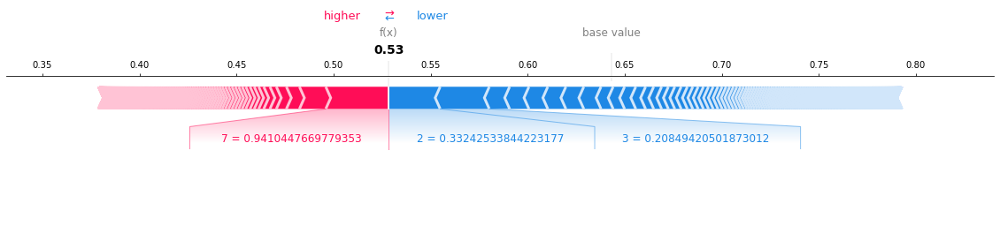

0.5284568318092466
0
The compound is predicted DILI-Negative
unbound Cmax:  4.93 uM
total Cmax:  12.94 uM
Most contributing MACCS substructure to DILI toxicity
Presence of this substructure contributes 0.0001 to prediction
Most contributing MACCS substructure to DILI safety
Presence of this substructure contributes -0.001 to prediction


In [9]:
        test = {'smiles_r':  [smiles_r]
                    }
        test = pd.DataFrame(test)

        desc=pd.read_csv("all_features_desc.csv", encoding='windows-1252')


        molecule = Chem.MolFromSmiles(smiles_r)     
        #st.image(Draw.MolToImage(molecule), width=200)
                
        test_mfp_Mordred = calc_all_fp_desc(test)
        test_mfp_Mordred_liv = predict_liv_all(test_mfp_Mordred)
        test_mfp_Mordred_liv_values = test_mfp_Mordred_liv.T.reset_index().rename(columns={"index":"name", 0: "value"})

        interpret, y_proba, y_pred = predict_DILI(test_mfp_Mordred_liv)   
        interpret = pd.merge(interpret, desc, right_on="name", left_on="name", how="outer")
        interpret = pd.merge(interpret, test_mfp_Mordred_liv_values, right_on="name", left_on="name", how="inner") 

        print(y_proba[0])
        print(y_pred[0]) 
        
        if(y_pred[0]==1):
            print("The compound is predicted DILI-Positive")
        if(y_pred[0]==0):
            print("The compound is predicted DILI-Negative")
        
        print("unbound Cmax: ", np.round(10**-test_mfp_Mordred_liv["median pMolar unbound plasma concentration"][0] *10**6, 2), "uM")
        print("total Cmax: ", np.round(10**-test_mfp_Mordred_liv["median pMolar total plasma concentration"][0] *10**6, 2), "uM")
        print("Most contributing MACCS substructure to DILI toxicity")
        
        top = interpret[interpret["SHAP"]>0].sort_values(by=["SHAP"], ascending=False)
        proxy_DILI_SHAP_top = pd.merge(info, top[top["name"].isin(liv_data)])
        proxy_DILI_SHAP_top["pred"] = proxy_DILI_SHAP_top["value"]>0.50
        proxy_DILI_SHAP_top["SHAP contribution to Toxicity"] = "Positive"
        proxy_DILI_SHAP_top["smiles"] = smiles_r
        
        top_positives = top[top["value"]==1]
        top_MACCS= top_positives[top_positives.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["description"].values[0]
        top_MACCS_value= top_positives[top_positives.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["value"].values[0]
        top_MACCS_shap= top_positives[top_positives.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["SHAP"].values[0] 
        top_MACCSsubstructure = Chem.MolFromSmarts(top_MACCS)
        
        Draw.MolToImage(molecule, highlightAtoms=molecule.GetSubstructMatch(top_MACCSsubstructure), width=400)        
        print("Presence of this substructure contributes", np.round(top_MACCS_shap, 4), "to prediction")
                     
                 
        print("Most contributing MACCS substructure to DILI safety")
        bottom = interpret[interpret["SHAP"]<0].sort_values(by=["SHAP"], ascending=True)
        proxy_DILI_SHAP_bottom = pd.merge(info, bottom[bottom["name"].isin(liv_data)])
        proxy_DILI_SHAP_bottom["pred"] = proxy_DILI_SHAP_bottom["value"]>0.50
        proxy_DILI_SHAP_bottom["SHAP contribution to Toxicity"] = "Negative"
        proxy_DILI_SHAP_bottom["smiles"] = smiles_r
        
        bottom_positives = bottom[bottom["value"]==1]
        bottom_MACCS= bottom_positives[bottom_positives.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["description"].values[0]
        bottom_MACCS_value= bottom_positives[bottom_positives.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["value"].values[0]
        bottom_MACCS_shap= bottom_positives[bottom_positives.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["SHAP"].values[0]     
        bottom_MACCSsubstructure = Chem.MolFromSmarts(bottom_MACCS)
                 
                                  
        Draw.MolToImage(molecule, highlightAtoms=molecule.GetSubstructMatch(bottom_MACCSsubstructure), width=400) 
        print("Presence of this substructure contributes", np.round(bottom_MACCS_shap, 4), "to prediction")

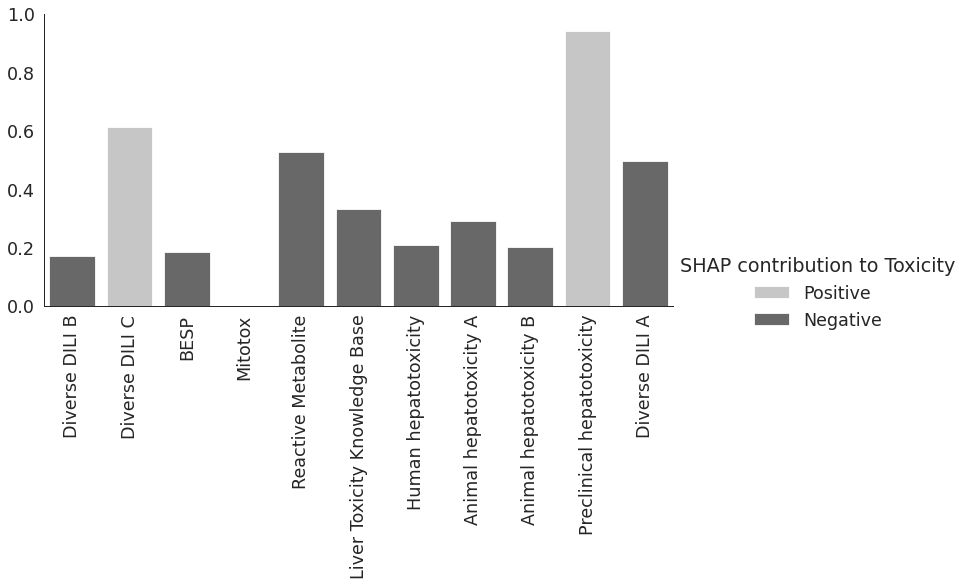

In [10]:
import seaborn as sns
SHAP =pd.DataFrame(columns=['name', 'source', 'assaytype', 'SHAP', 'description', 'value', 'pred','influence', 'smiles'])
SHAP = pd.concat([SHAP, proxy_DILI_SHAP_top])
SHAP = pd.concat([SHAP, proxy_DILI_SHAP_bottom])
SHAP["name"] = SHAP["name"].astype(str)
SHAP = SHAP.sort_values(by=["name"], ascending=True)
#fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
sns.set_style('white')
sns.set_context('paper', font_scale=2)
hue_order = ['Positive', 'Negative']
#sns.barplot(data=compound, x="source", y="value", color='grey')
g = sns.catplot(data=SHAP, x="source", y="value", kind="bar", hue_order=hue_order,  hue="SHAP contribution to Toxicity",  
                palette="Greys", height=5, aspect=2, dodge=False, legend=True)
#plt.axhline(y=0.5, color='r', linestyle='--')
g.set_xticklabels(rotation=90)
g.set(ylabel=None)
g.set(xlabel=None)
g.set(ylim=(0, 1))
plt.show()

In [11]:
SHAP

,name,source,assaytype,SHAP,description,value,pred,influence,smiles,SHAP contribution to Toxicity
5,10,Diverse DILI B,Heterogenous Data,-0.009957,"US drug-induced liver injury network (DILIN) ,...",0.16936,False,NaN,CCCCOCCO,Negative
1,11,Diverse DILI C,Heterogenous Data,0.00517,"Transient liver function abnormalities, advers...",0.612087,True,NaN,CCCCOCCO,Positive
6,14,BESP,Mechanisms of Liver Toxicity,-0.006261,BESP Bile Salt Export Pump Inhibition,0.183858,False,NaN,CCCCOCCO,Negative
7,15,Mitotox,Mechanisms of Liver Toxicity,-0.00922,Mitotox,0.000059,False,NaN,CCCCOCCO,Negative
8,16,Reactive Metabolite,Mechanisms of Liver Toxicity,-0.002765,Reactive Metabolite Formation,0.526413,True,NaN,CCCCOCCO,Negative
0,2,Liver Toxicity Knowledge Base,DILI,-0.026408,"Liver Toxicity Knowledge Base (LTKB), prescrip...",0.332425,False,NaN,CCCCOCCO,Negative
1,3,Human hepatotoxicity,Human hepatotoxicity,-0.025325,"Human hepatotoxicity, hepatobiallry",0.208494,False,NaN,CCCCOCCO,Negative
2,5,Animal hepatotoxicity A,Animal hepatotoxicity,-0.000809,"Rat, chronic oral administration, Hepatic hist...",0.290003,False,NaN,CCCCOCCO,Negative
3,6,Animal hepatotoxicity B,Animal hepatotoxicity,-0.00577,"Hepatocellular hypertrophy, rats, ORAD, HESS",0.20096,False,NaN,CCCCOCCO,Negative
0,7,Preclinical hepatotoxicity,Animal hepatotoxicity,0.032516,Preclinical hepatotoxicity data from PharmaPen...,0.941045,True,NaN,CCCCOCCO,Positive


In [12]:
SHAP

,name,source,assaytype,SHAP,description,value,pred,influence,smiles,SHAP contribution to Toxicity
5,10,Diverse DILI B,Heterogenous Data,-0.009957,"US drug-induced liver injury network (DILIN) ,...",0.16936,False,NaN,CCCCOCCO,Negative
1,11,Diverse DILI C,Heterogenous Data,0.00517,"Transient liver function abnormalities, advers...",0.612087,True,NaN,CCCCOCCO,Positive
6,14,BESP,Mechanisms of Liver Toxicity,-0.006261,BESP Bile Salt Export Pump Inhibition,0.183858,False,NaN,CCCCOCCO,Negative
7,15,Mitotox,Mechanisms of Liver Toxicity,-0.00922,Mitotox,0.000059,False,NaN,CCCCOCCO,Negative
8,16,Reactive Metabolite,Mechanisms of Liver Toxicity,-0.002765,Reactive Metabolite Formation,0.526413,True,NaN,CCCCOCCO,Negative
0,2,Liver Toxicity Knowledge Base,DILI,-0.026408,"Liver Toxicity Knowledge Base (LTKB), prescrip...",0.332425,False,NaN,CCCCOCCO,Negative
1,3,Human hepatotoxicity,Human hepatotoxicity,-0.025325,"Human hepatotoxicity, hepatobiallry",0.208494,False,NaN,CCCCOCCO,Negative
2,5,Animal hepatotoxicity A,Animal hepatotoxicity,-0.000809,"Rat, chronic oral administration, Hepatic hist...",0.290003,False,NaN,CCCCOCCO,Negative
3,6,Animal hepatotoxicity B,Animal hepatotoxicity,-0.00577,"Hepatocellular hypertrophy, rats, ORAD, HESS",0.20096,False,NaN,CCCCOCCO,Negative
0,7,Preclinical hepatotoxicity,Animal hepatotoxicity,0.032516,Preclinical hepatotoxicity data from PharmaPen...,0.941045,True,NaN,CCCCOCCO,Positive


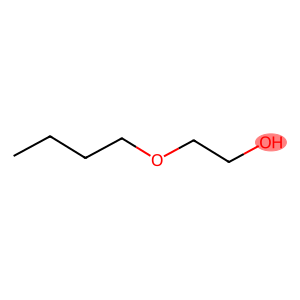

In [13]:
Draw.MolToImage(molecule, highlightAtoms=molecule.GetSubstructMatch(top_MACCSsubstructure), width=40)

In [14]:
test_mfp_Mordred_liv

,smiles_r,Mfp0,Mfp1,Mfp2,Mfp3,Mfp4,Mfp5,Mfp6,Mfp7,Mfp8,...,6,7,8,10,11,14,15,16,median pMolar unbound plasma concentration,median pMolar total plasma concentration
0,CCCCOCCO,0,0,0,0,0,0,0,0,0,...,0.20096,0.941045,0.496632,0.16936,0.612087,0.183858,0.000059,0.526413,5.307496,4.888161


In [15]:
test_mfp_Mordred_liv_values

,name,value
0,smiles_r,CCCCOCCO
1,Mfp0,0
2,Mfp1,0
3,Mfp2,0
4,Mfp3,0
...,...,...
3852,14,0.183858
3853,15,0.000059
3854,16,0.526413
3855,median pMolar unbound plasma concentration,5.307496


In [16]:
smiles_list = literature.smiles_r.to_list()
smiles_list

['CCCCOCCO',
 'COc1cc(C)c(/C=C/C(C)=C/C=C/C(C)=C/C(=O)O)c(C)c1C',
 'CC1=C(/C=C/C(C)=C/C=C/C(C)=C/C=C/C=C(C)/C=C/C=C(C)/C=C/C2=C(C)C(=O)[C@@H](O)CC2(C)C)C(C)(C)C[C@H](O)C1=O',
 'CO[C@H]1C(=O)[C@]2(C)[C@@H](OC)C[C@H]3OC[C@@]3(OC(C)=O)[C@H]2[C@H](OC(=O)c2ccccc2)[C@]2(O)C[C@H](OC(=O)[C@H](O)[C@@H](NC(=O)OC(C)(C)C)c3ccccc3)C(C)=C1C2(C)C',
 'COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1',
 'CC(=O)O[C@@]12CO[C@@H]1C[C@H](O)[C@@]1(C)C(=O)[C@H](O)C3=C(C)[C@@H](OC(=O)[C@H](O)[C@@H](NC(=O)OC(C)(C)C)c4ccccc4)C[C@@](O)([C@@H](OC(=O)c4ccccc4)[C@H]21)C3(C)C',
 'C[C@H]1c2cccc(O)c2C(=O)C2=C(O)[C@]3(O)C(=O)C(C(N)=O)=C(O)[C@@H](N(C)C)[C@@H]3[C@@H](O)[C@@H]21',
 'CCN(CC)C(=O)/C(C#N)=C/c1cc(O)c(O)c([N+](=O)[O-])c1',
 'CNC(=O)c1ccc(N2C(=S)N(c3ccc(C#N)c(C(F)(F)F)c3)C(=O)C2(C)C)cc1F',
 'Nc1ccn([C@@H]2O[C@H](CO)[C@@H](O)C2(F)F)c(=O)n1',
 'CN(C)c1ccc(O)c2c1C[C@H]1C[C@H]3[C@H](N(C)C)C(O)=C(C(N)=O)C(=O)[C@@]3(O)C(O)=C1C2=O',
 'COc1c(N2C[C@@H]3CCCN[C@@H]3C2)c(F)cc2c(=O)c(C(=O)O)cn(C3CC3)c12',
 'CC(=O)O[C@H]1C(=O)[C@@]2(C)

In [17]:
names= literature.name.to_list()
names

['2-Butoxyethanol',
 'Acitretin',
 'Astaxanthin',
 'Cabazitaxel',
 'Clopidogrel',
 'Docetaxel',
 'Doxycycline',
 'Entacapone',
 'Enzalutamide',
 'Gemcitabine',
 'Minocycline',
 'Moxifloxacin',
 'Paclitaxel',
 'Sitaxentan',
 'Trovafloxacin',
 'Ximelagatran']

In [18]:
for name in names:
    print(name)

2-Butoxyethanol
Acitretin
Astaxanthin
Cabazitaxel
Clopidogrel
Docetaxel
Doxycycline
Entacapone
Enzalutamide
Gemcitabine
Minocycline
Moxifloxacin
Paclitaxel
Sitaxentan
Trovafloxacin
Ximelagatran


CCCCOCCO
2-Butoxyethanol
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.93it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


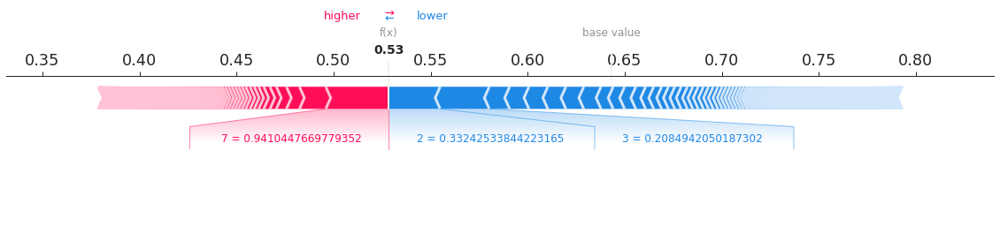

0.5284568318092469
0
Negative
unbound Cmax:  4.93 uM
total Cmax:  12.94 uM
Most contributing MACCS substructure to DILI toxicity
[$([!#6;!#1;!H0]~*~*~*~[CH2]~*),$([!#6;!#1;!H0;R]1@[R]@[R]@[R]@[CH2;R]1),$([!#6;!#1;!H0]~[R]1@[R]@[R]@[CH2;R]1),$([!#6;!#1;!H0]~*~[R]1@[R]@[CH2;R]1)]
[$(*~[CH2]~*~*~*~[CH2]~*),$([R]1@[CH2;R]@[R]@[R]@[R]@[CH2;R]1),$(*~[CH2]~[R]1@[R]@[R]@[CH2;R]1),$(*~[CH2]~*~[R]1@[R]@[CH2;R]1)]
COc1cc(C)c(/C=C/C(C)=C/C=C/C(C)=C/C(=O)O)c(C)c1C
Acitretin
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.64it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


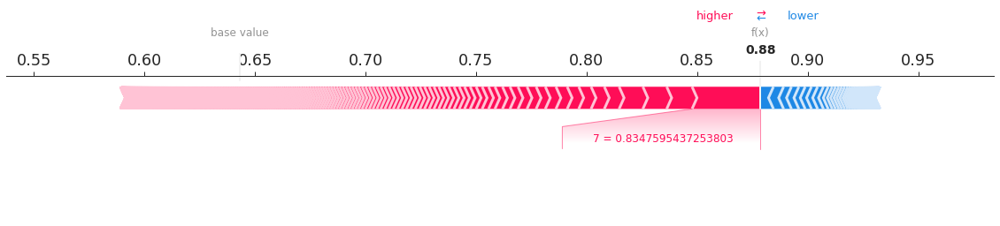

0.878629396038166
1
Positive
unbound Cmax:  0.13 uM
total Cmax:  0.63 uM
Most contributing MACCS substructure to DILI toxicity
[#6]=[#6](~[#6])~[#6]
[!#6;!#1]~[CH3]
CC1=C(/C=C/C(C)=C/C=C/C(C)=C/C=C/C=C(C)/C=C/C=C(C)/C=C/C2=C(C)C(=O)[C@@H](O)CC2(C)C)C(C)(C)C[C@H](O)C1=O
Astaxanthin
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.46it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


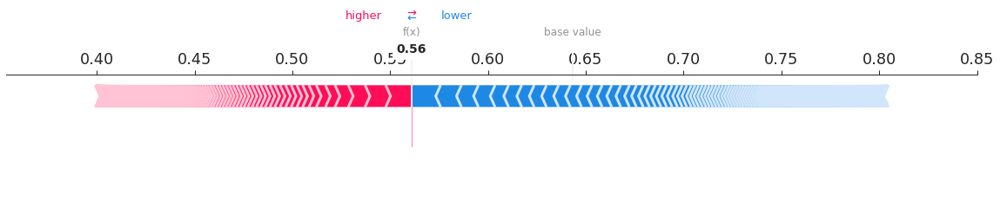

0.5608984981730923
0
Negative
unbound Cmax:  0.05 uM
total Cmax:  1.51 uM
Most contributing MACCS substructure to DILI toxicity
[#6]=[#6](~[#6])~[#6]
*~*(~*)(~*)~*
CO[C@H]1C(=O)[C@]2(C)[C@@H](OC)C[C@H]3OC[C@@]3(OC(C)=O)[C@H]2[C@H](OC(=O)c2ccccc2)[C@]2(O)C[C@H](OC(=O)[C@H](O)[C@@H](NC(=O)OC(C)(C)C)c3ccccc3)C(C)=C1C2(C)C
Cabazitaxel
1613


100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


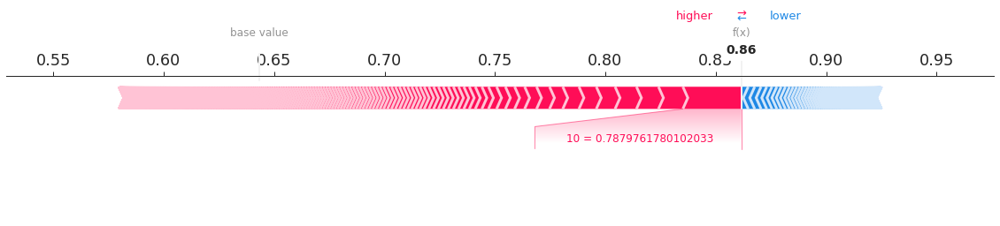

0.8616184164356059
1
Positive
unbound Cmax:  0.29 uM
total Cmax:  0.73 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
*~*(~*)(~*)~*
COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1
Clopidogrel
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


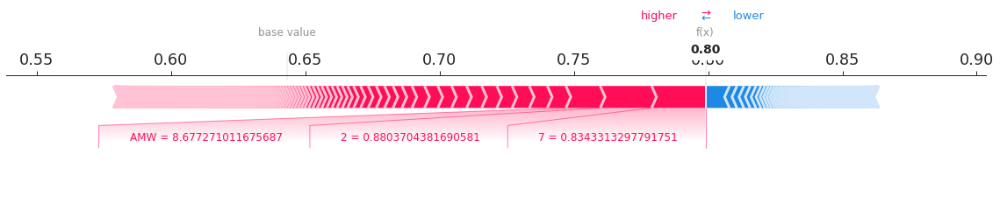

0.7989828666203082
1
Positive
unbound Cmax:  0.08 uM
total Cmax:  0.82 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[#6]~[#7](~[#6])~[#6]
CC(=O)O[C@@]12CO[C@@H]1C[C@H](O)[C@@]1(C)C(=O)[C@H](O)C3=C(C)[C@@H](OC(=O)[C@H](O)[C@@H](NC(=O)OC(C)(C)C)c4ccccc4)C[C@@](O)([C@@H](OC(=O)c4ccccc4)[C@H]21)C3(C)C
Docetaxel
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


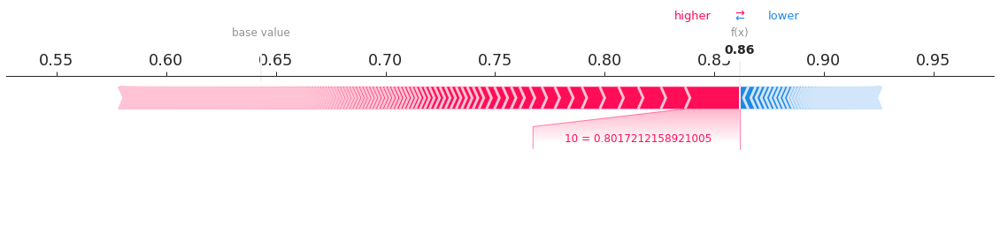

0.8615385336859205
1
Positive
unbound Cmax:  0.3 uM
total Cmax:  1.36 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
*~*(~*)(~*)~*
C[C@H]1c2cccc(O)c2C(=O)C2=C(O)[C@]3(O)C(=O)C(C(N)=O)=C(O)[C@@H](N(C)C)[C@@H]3[C@@H](O)[C@@H]21
Doxycycline
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.58it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


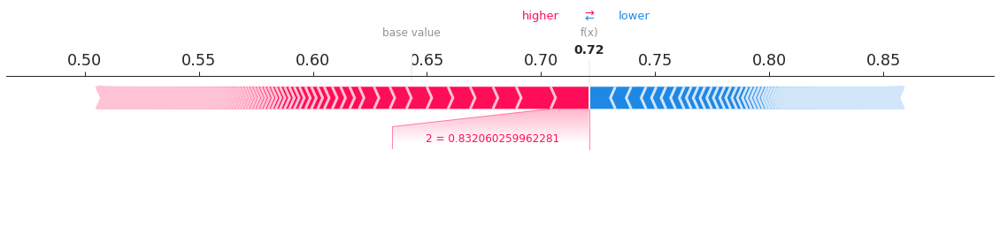

0.7210170781304154
1
Positive
unbound Cmax:  0.54 uM
total Cmax:  3.36 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[!#6;!#1;!H0]~*~*~[!#6;!#1;!H0]
CCN(CC)C(=O)/C(C#N)=C/c1cc(O)c(O)c([N+](=O)[O-])c1
Entacapone
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.85it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


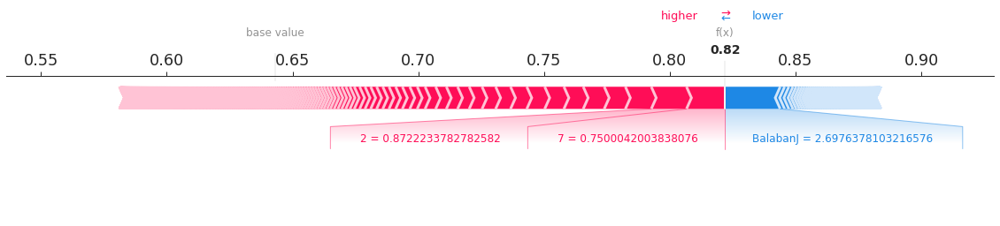

0.8219973417121305
1
Positive
unbound Cmax:  1.35 uM
total Cmax:  12.92 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[!#6;!#1;!H0]~*~*~[!#6;!#1;!H0]
CNC(=O)c1ccc(N2C(=S)N(c3ccc(C#N)c(C(F)(F)F)c3)C(=O)C2(C)C)cc1F
Enzalutamide
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.20it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


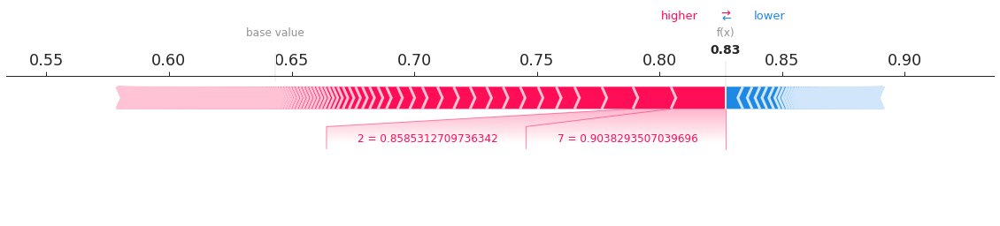

0.8269017363072462
1
Positive
unbound Cmax:  0.1 uM
total Cmax:  7.68 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[#6]~[#7](~[#6])~[#6]
Nc1ccn([C@@H]2O[C@H](CO)[C@@H](O)C2(F)F)c(=O)n1
Gemcitabine
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


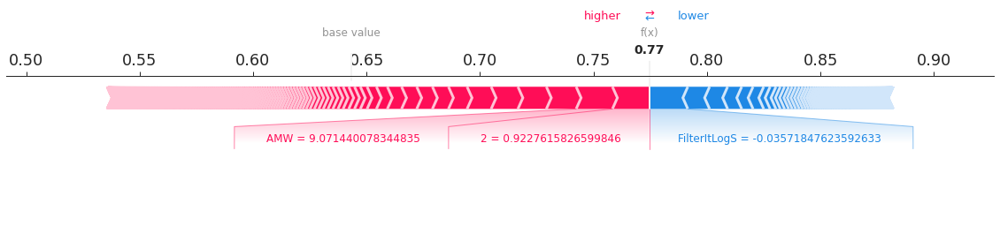

0.7745911300791516
1
Positive
unbound Cmax:  5.8 uM
total Cmax:  12.07 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[#6]~[#7](~[#6])~[#6]
CN(C)c1ccc(O)c2c1C[C@H]1C[C@H]3[C@H](N(C)C)C(O)=C(C(N)=O)C(=O)[C@@]3(O)C(O)=C1C2=O
Minocycline
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.59it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


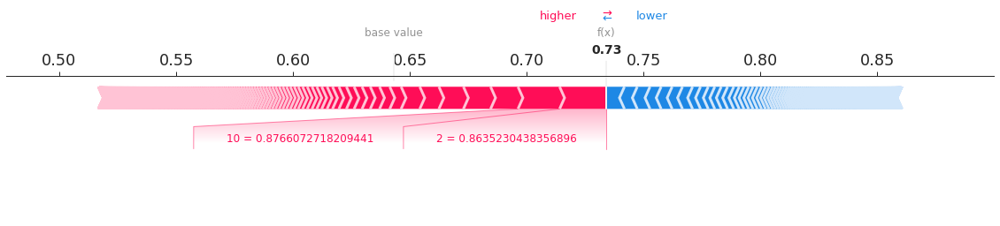

0.7341369428707027
1
Positive
unbound Cmax:  0.3 uM
total Cmax:  1.77 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[!#6;!#1;!H0]~*~*~[!#6;!#1;!H0]
COc1c(N2C[C@@H]3CCCN[C@@H]3C2)c(F)cc2c(=O)c(C(=O)O)cn(C3CC3)c12
Moxifloxacin
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.89it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


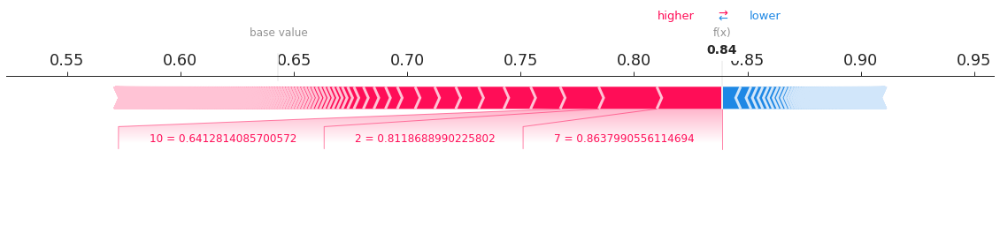

0.8388272137560827
1
Positive
unbound Cmax:  0.17 uM
total Cmax:  2.74 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[#6]~[#7](~[#6])~[#6]
CC(=O)O[C@H]1C(=O)[C@@]2(C)[C@H]([C@H](OC(=O)c3ccccc3)[C@]3(O)C[C@H](OC(=O)[C@H](O)[C@@H](NC(=O)c4ccccc4)c4ccccc4)C(C)=C1C3(C)C)[C@]1(OC(C)=O)CO[C@@H]1C[C@@H]2O
Paclitaxel
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


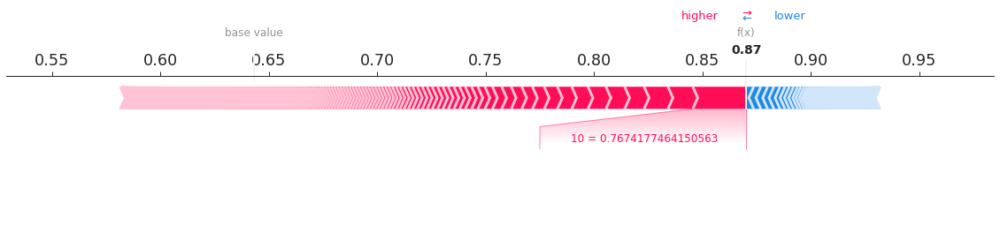

0.870242238189885
1
Positive
unbound Cmax:  0.34 uM
total Cmax:  2.47 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[#8]~*~*~[#8]
Cc1cc2c(cc1CC(=O)c1sccc1S(=O)(=O)Nc1onc(C)c1Cl)OCO2
Sitaxentan
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.20it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


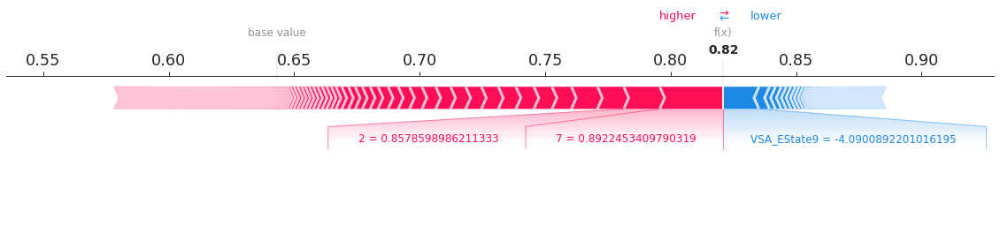

0.8209819084299054
1
Positive
unbound Cmax:  0.14 uM
total Cmax:  7.36 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[#8]~*~*~[#8]
N[C@@H]1[C@H]2CN(c3nc4c(cc3F)c(=O)c(C(=O)O)cn4-c3ccc(F)cc3F)C[C@@H]12
Trovafloxacin
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.11it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


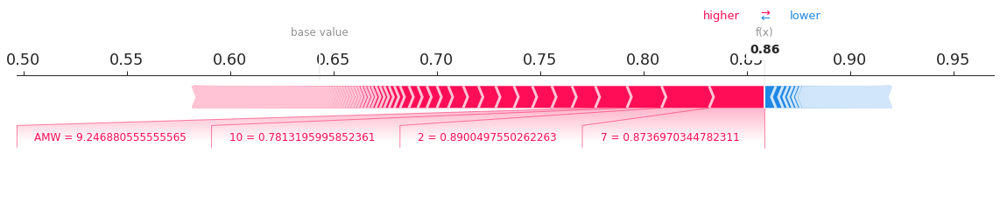

0.8585651564188631
1
Positive
unbound Cmax:  0.28 uM
total Cmax:  4.34 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[#6]~[#7](~[#6])~[#6]
CCOC(=O)CN[C@@H](C(=O)N1CC[C@H]1C(=O)NCc1ccc(/C(N)=N/O)cc1)C1CCCCC1
Ximelagatran
1613


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]
X has feature names, but RandomForestClassifier was fitted without feature names


Best Threshold=0.612911


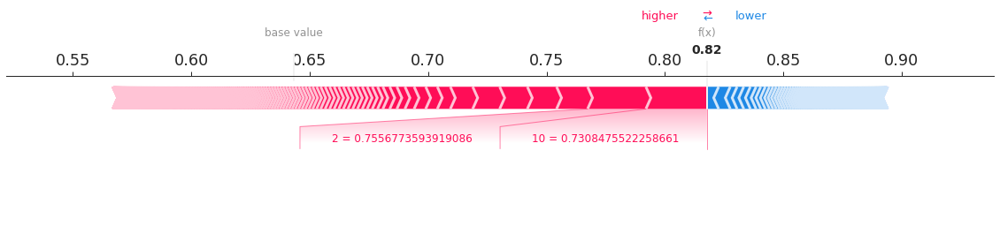

0.8177433607615103
1
Positive
unbound Cmax:  0.11 uM
total Cmax:  0.75 uM
Most contributing MACCS substructure to DILI toxicity
*!@*@*!@*
[!#6;!#1;!H0]~*~*~[!#6;!#1;!H0]


In [19]:
list_of_lists=[]
SHAP =pd.DataFrame(columns=['name', 'source', 'assaytype', 'SHAP', 'description', 'value', 'pred','influence', 'smiles'])

for s, n in zip(smiles_list, names):  
    
    print(s)
    print(n)
    smiles = unquote(s)
    
    smiles_r = standardized_smiles(smiles)
    test = {'smiles_r':  [smiles_r]
                }
    test = pd.DataFrame(test)
    
    test_mfp_Mordred = calc_all_fp_desc(test)
    
    test_mfp_Mordred_liv = predict_liv_all(test_mfp_Mordred)
    test_mfp_Mordred_liv_values = test_mfp_Mordred_liv.T.reset_index().rename(columns={"index":"name", 0: "value"})
    
    desc=pd.read_csv("all_features_desc.csv", encoding='windows-1252')

    interpret, y_proba, y_pred = predict_DILI(test_mfp_Mordred_liv)   
    interpret = pd.merge(interpret, desc, right_on="name", left_on="name", how="outer")
    interpret = pd.merge(interpret, test_mfp_Mordred_liv_values, right_on="name", left_on="name", how="inner") 

    print(y_proba[0])
    print(y_pred[0])
    
    if(y_pred[0] == 0):
        print("Negative")
    else:
        print("Positive")
        
    print("unbound Cmax: ", np.round(10**-test_mfp_Mordred_liv["median pMolar unbound plasma concentration"][0] *10**6, 2), "uM")
    print("total Cmax: ", np.round(10**-test_mfp_Mordred_liv["median pMolar total plasma concentration"][0] *10**6, 2), "uM")
    print("Most contributing MACCS substructure to DILI toxicity")
        
    top = interpret[interpret["SHAP"]>0].sort_values(by=["SHAP"], ascending=False)#.reset_index(drop=True)
    proxy_DILI_SHAP_top = pd.merge(info, top[top["name"].isin(liv_data)])
    proxy_DILI_SHAP_top["pred"] = proxy_DILI_SHAP_top["value"]>0.50
    proxy_DILI_SHAP_top["SHAP contribution to Toxicity"] = "Positive"
    proxy_DILI_SHAP_top["smiles"] = s
    proxy_DILI_SHAP_top["compound"] = n
    
    top_positives = top[top["value"]==1]
    top_MACCS= top_positives[top_positives.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["description"].values[0]
    print(top_MACCS)
    
    bottom = interpret[interpret["SHAP"]<0].sort_values(by=["SHAP"], ascending=True)#.reset_index(drop=True)
    proxy_DILI_SHAP_bottom = pd.merge(info, bottom[bottom["name"].isin(liv_data)])
    proxy_DILI_SHAP_bottom["pred"] = proxy_DILI_SHAP_bottom["value"]>0.50
    proxy_DILI_SHAP_bottom["SHAP contribution to Toxicity"] = "Negative"
    proxy_DILI_SHAP_bottom["smiles"] = s
    proxy_DILI_SHAP_bottom["compound"] = n
    
    bottom_positives = bottom[bottom["value"]==1]
    bottom_MACCS= bottom_positives[bottom_positives.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["description"].values[0]
    print(bottom_MACCS)
    
    SHAP = pd.concat([SHAP, proxy_DILI_SHAP_top])
    SHAP = pd.concat([SHAP, proxy_DILI_SHAP_bottom])
    
    
    row=[s, n, top_MACCS, bottom_MACCS]
    list_of_lists.append(row)
    

In [20]:
top

,name,SHAP,description,value
562,10,2.577061e-02,"US drug-induced liver injury network (DILIN) ,...",0.730848
556,2,2.462213e-02,"Liver Toxicity Knowledge Base (LTKB), prescrip...",0.755677
190,MIC3,1.309163e-02,3-ordered modified information content,40.64069
191,MIC4,1.234383e-02,4-ordered modified information content,40.72118
192,MIC5,1.166729e-02,5-ordered modified information content,40.72118
...,...,...,...,...
386,Mfp881,9.411088e-07,NaN,0
296,nFRing,6.012575e-07,fused ring count,0.0
135,StCH,5.190824e-07,sum of tCH,0.0
401,Mfp1162,4.660252e-07,NaN,0


In [21]:
SHAP["name"] = SHAP["name"].astype(int)
SHAP

,name,source,assaytype,SHAP,description,value,pred,influence,smiles,SHAP contribution to Toxicity,compound
0,7,Preclinical hepatotoxicity,Animal hepatotoxicity,0.032516,Preclinical hepatotoxicity data from PharmaPen...,0.941045,True,NaN,CCCCOCCO,Positive,2-Butoxyethanol
1,11,Diverse DILI C,Heterogenous Data,0.00517,"Transient liver function abnormalities, advers...",0.612087,True,NaN,CCCCOCCO,Positive,2-Butoxyethanol
0,2,Liver Toxicity Knowledge Base,DILI,-0.026408,"Liver Toxicity Knowledge Base (LTKB), prescrip...",0.332425,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol
1,3,Human hepatotoxicity,Human hepatotoxicity,-0.025325,"Human hepatotoxicity, hepatobiallry",0.208494,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol
2,5,Animal hepatotoxicity A,Animal hepatotoxicity,-0.000809,"Rat, chronic oral administration, Hepatic hist...",0.290003,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol
...,...,...,...,...,...,...,...,...,...,...,...
0,5,Animal hepatotoxicity A,Animal hepatotoxicity,-0.000834,"Rat, chronic oral administration, Hepatic hist...",0.118054,False,NaN,CCOC(=O)CN[C@@H](C(=O)N1CC[C@H]1C(=O)NCc1ccc(/...,Negative,Ximelagatran
1,6,Animal hepatotoxicity B,Animal hepatotoxicity,-0.002892,"Hepatocellular hypertrophy, rats, ORAD, HESS",0.175473,False,NaN,CCOC(=O)CN[C@@H](C(=O)N1CC[C@H]1C(=O)NCc1ccc(/...,Negative,Ximelagatran
2,7,Preclinical hepatotoxicity,Animal hepatotoxicity,-0.002418,Preclinical hepatotoxicity data from PharmaPen...,0.703204,True,NaN,CCOC(=O)CN[C@@H](C(=O)N1CC[C@H]1C(=O)NCc1ccc(/...,Negative,Ximelagatran
3,11,Diverse DILI C,Heterogenous Data,-0.001198,"Transient liver function abnormalities, advers...",0.410878,False,NaN,CCOC(=O)CN[C@@H](C(=O)N1CC[C@H]1C(=O)NCc1ccc(/...,Negative,Ximelagatran


In [22]:
SHAP.to_csv("./SHAP_molecules/SHAP_molecules.csv", index=False)

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns


2-Butoxyethanol
11


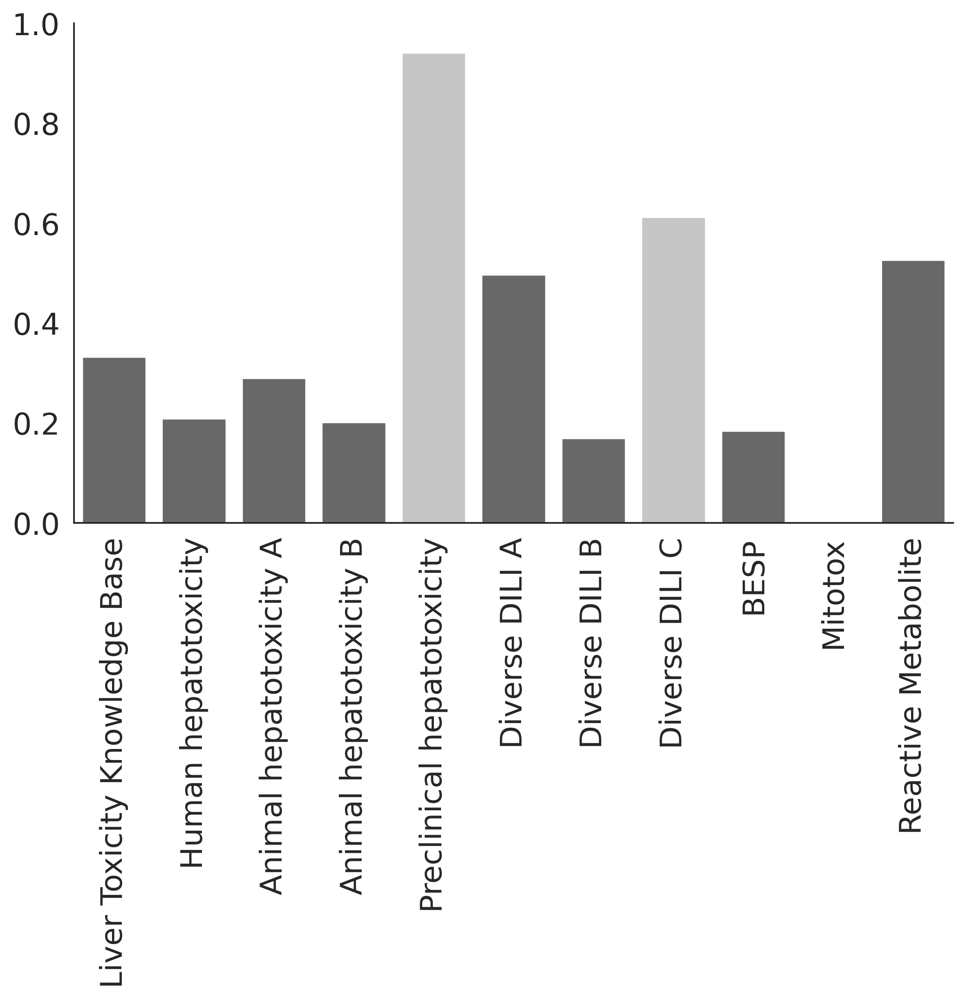

Acitretin
11


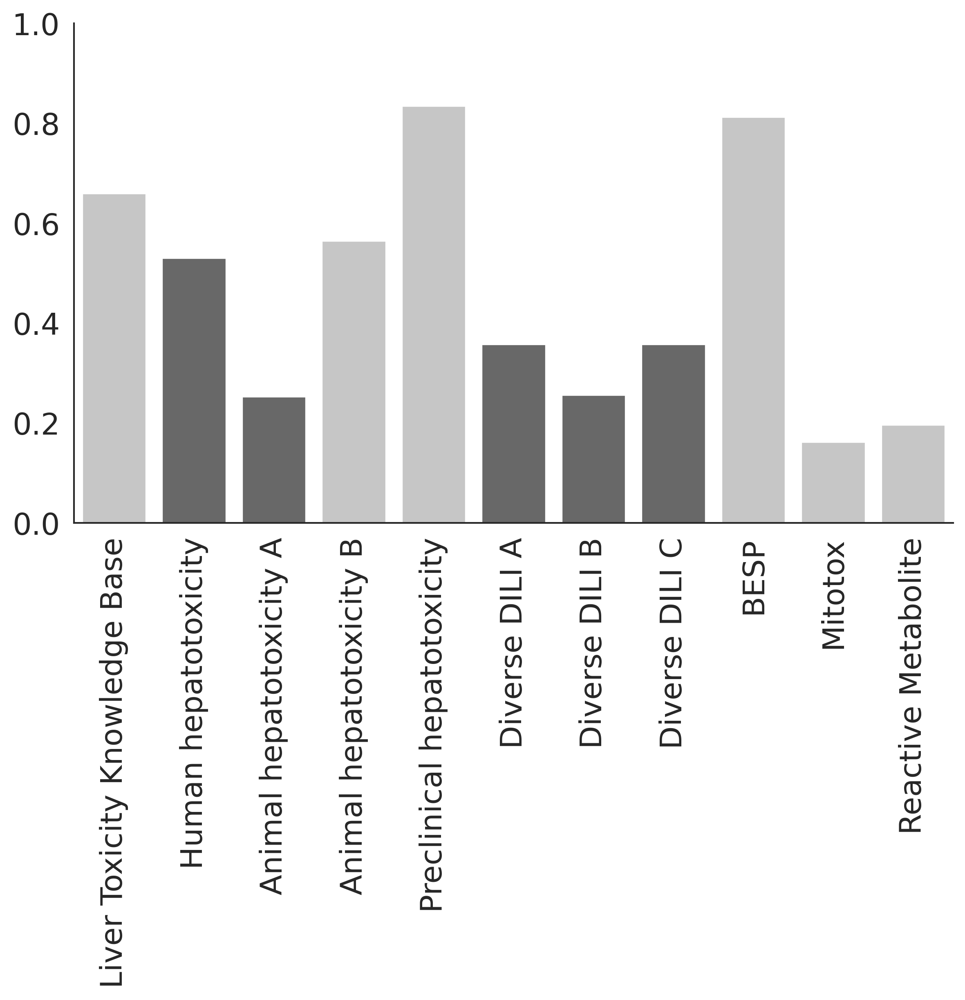

Astaxanthin
11


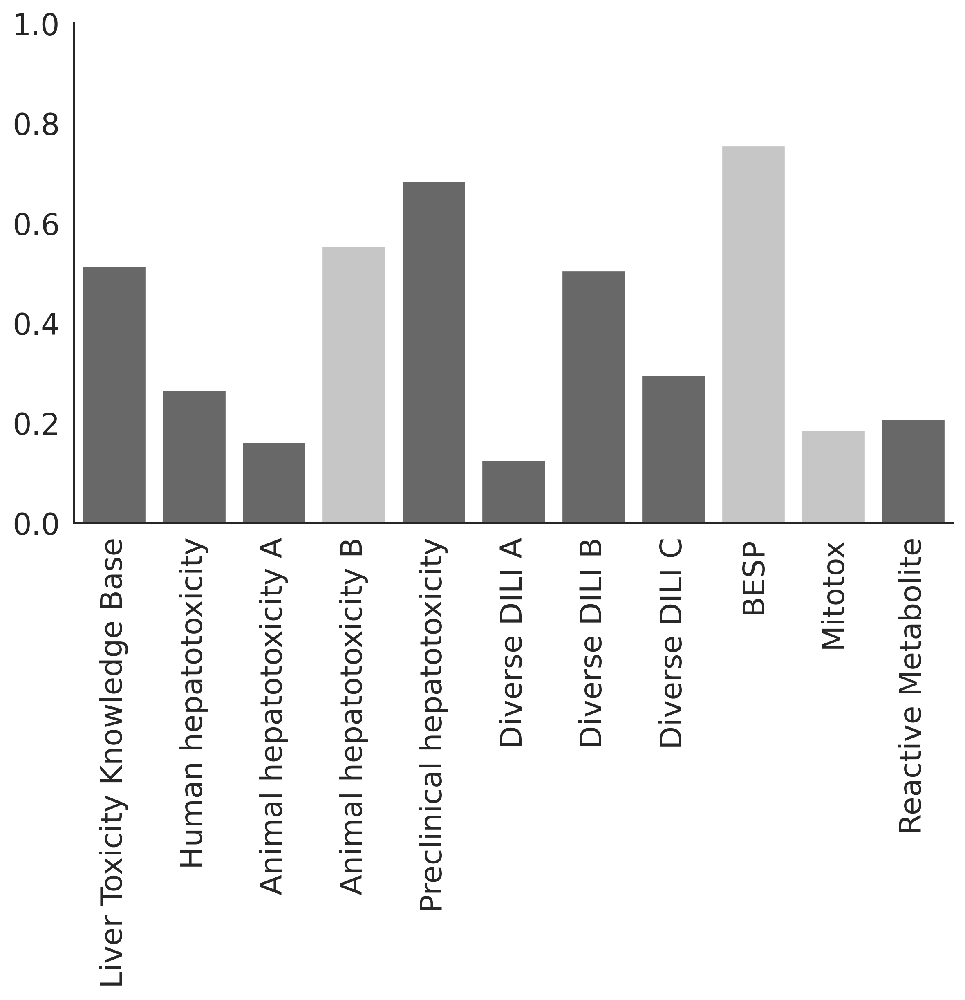

Cabazitaxel
11


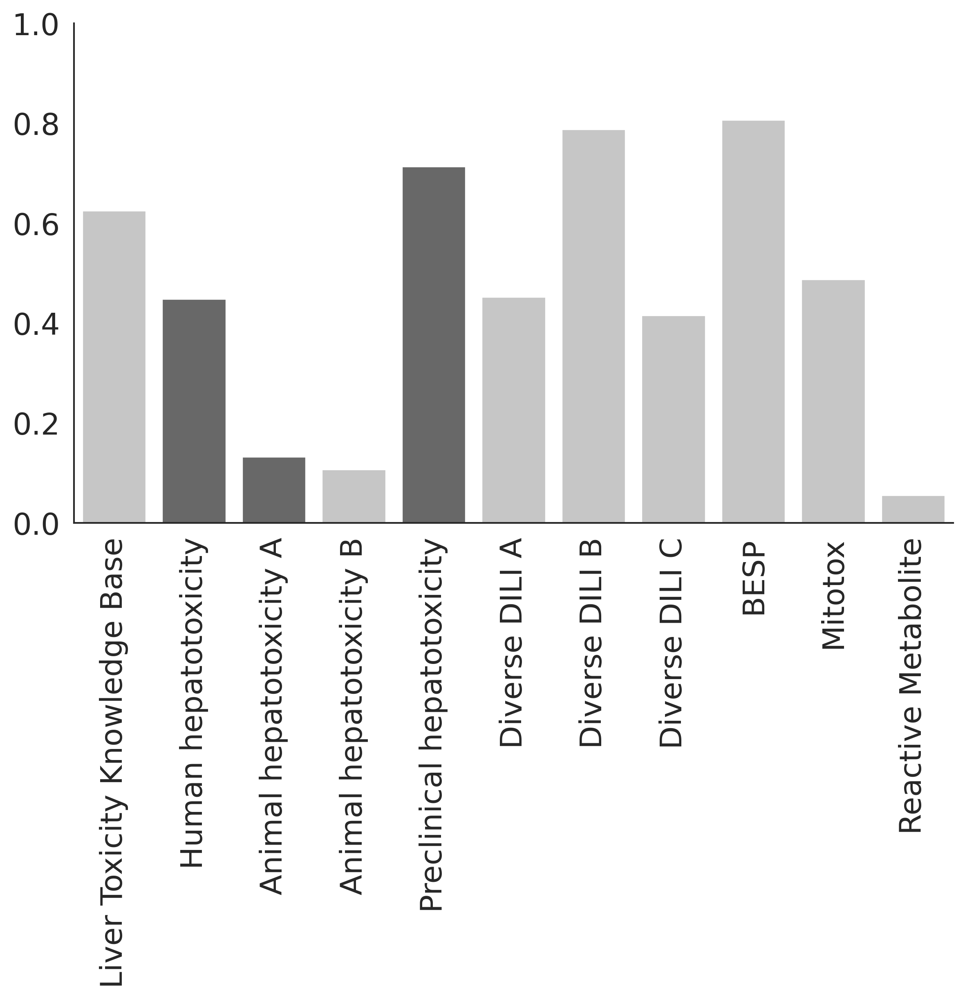

Clopidogrel
11


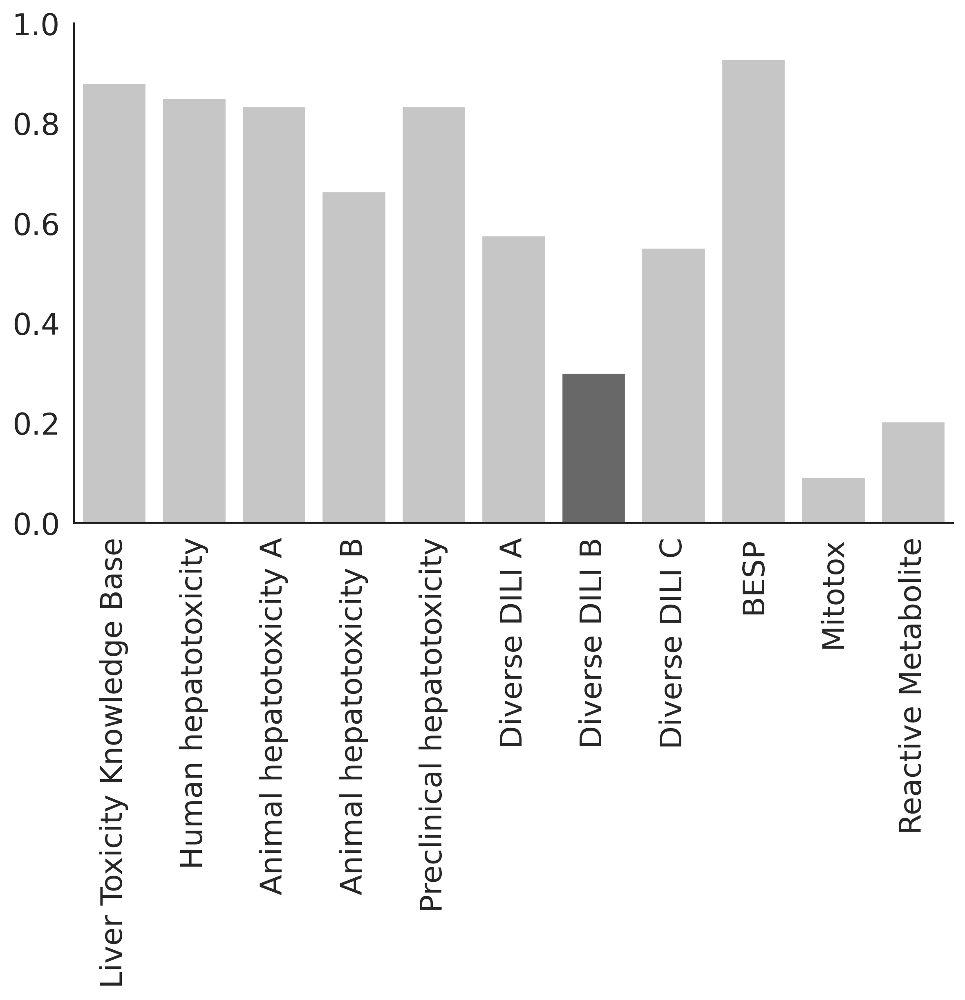

Docetaxel
11


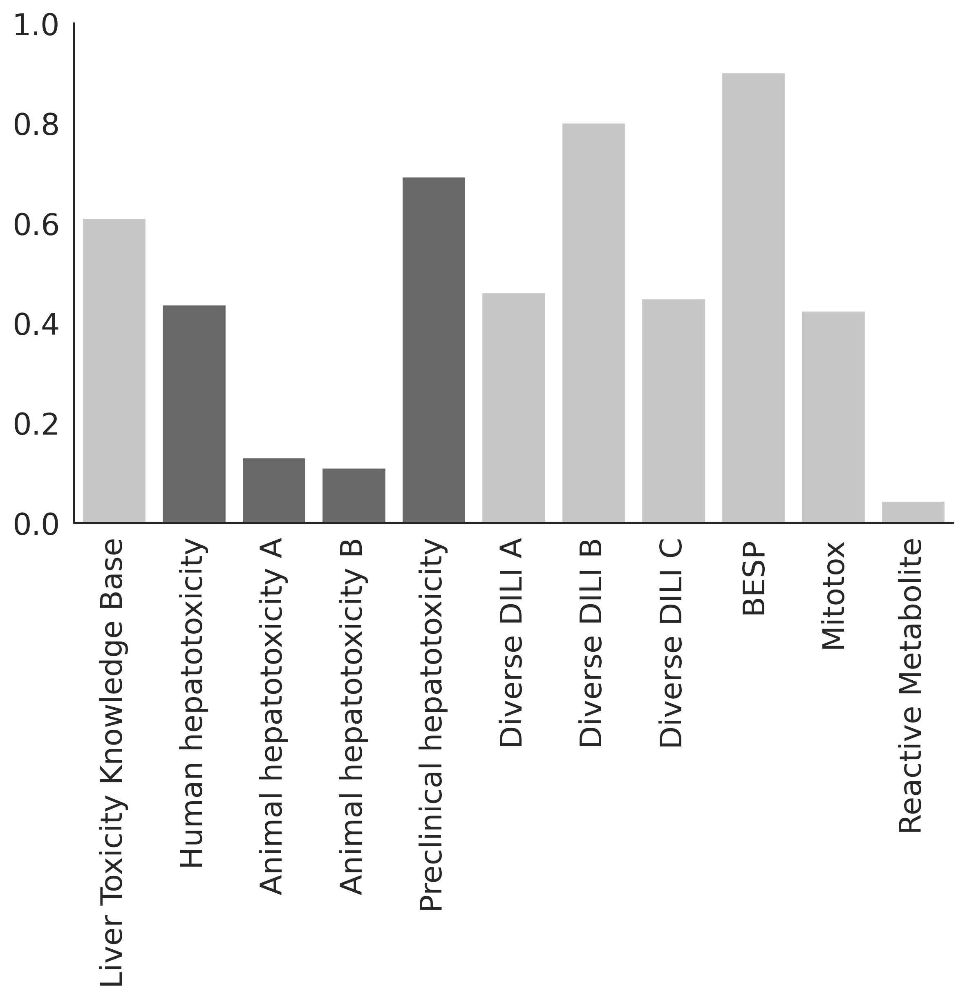

Doxycycline
11


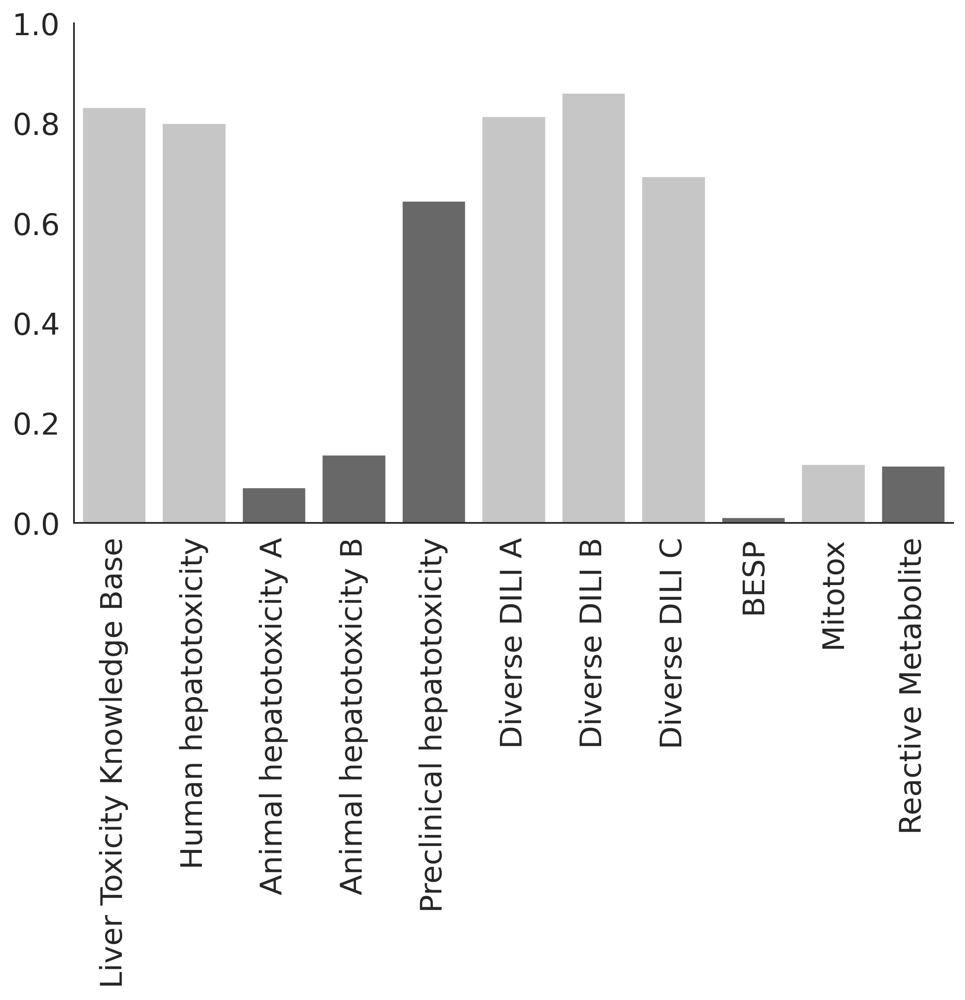

Entacapone
11


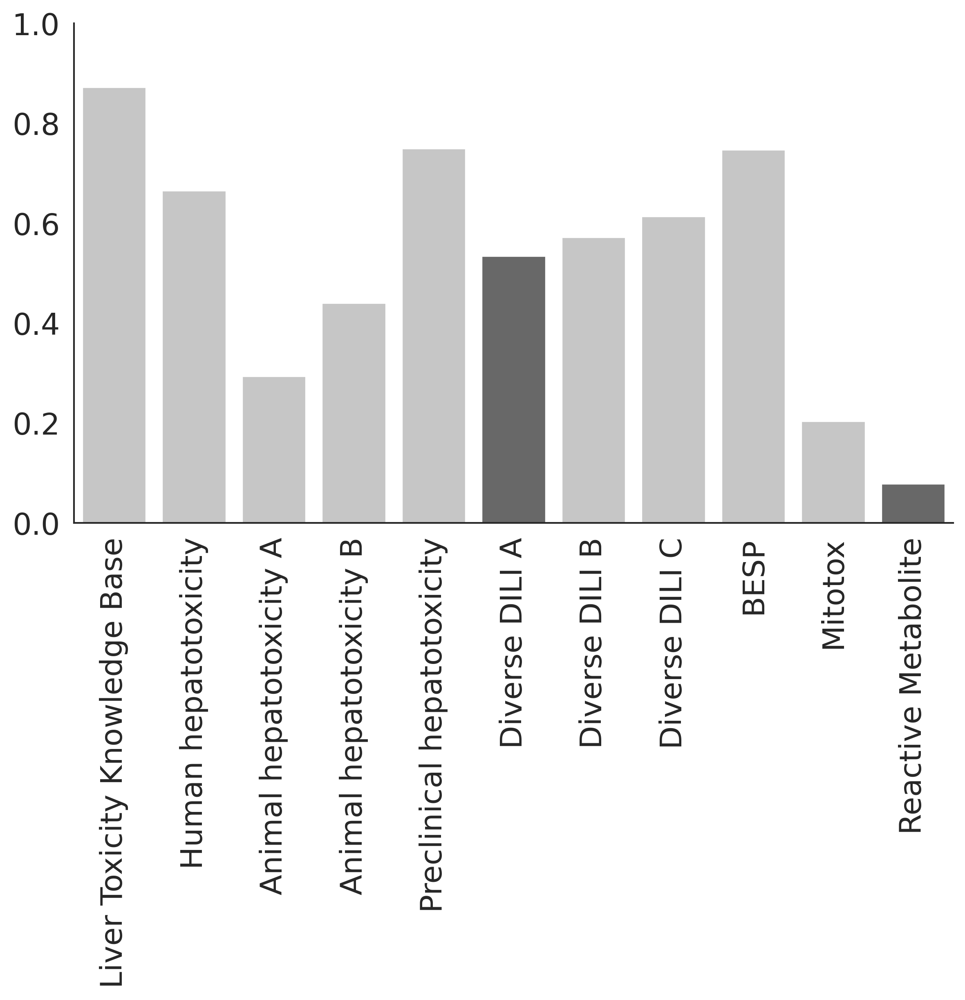

Enzalutamide
11


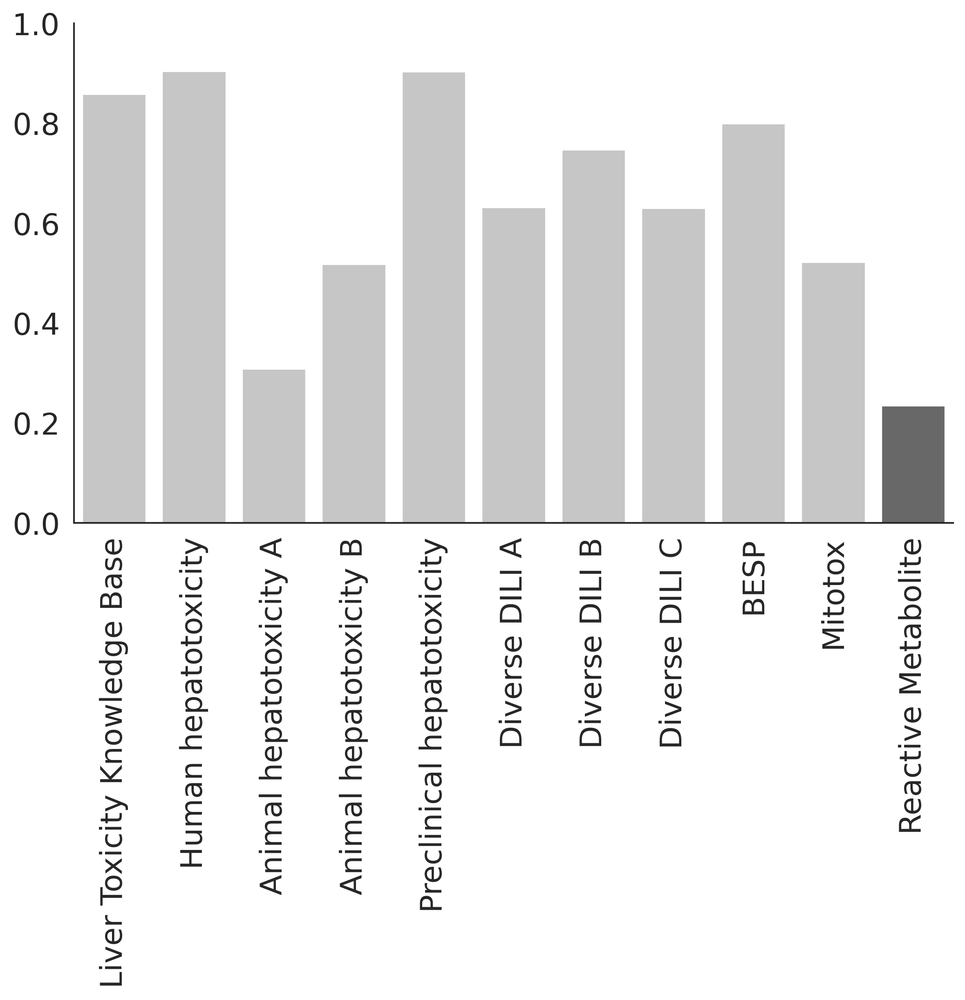

Gemcitabine
11


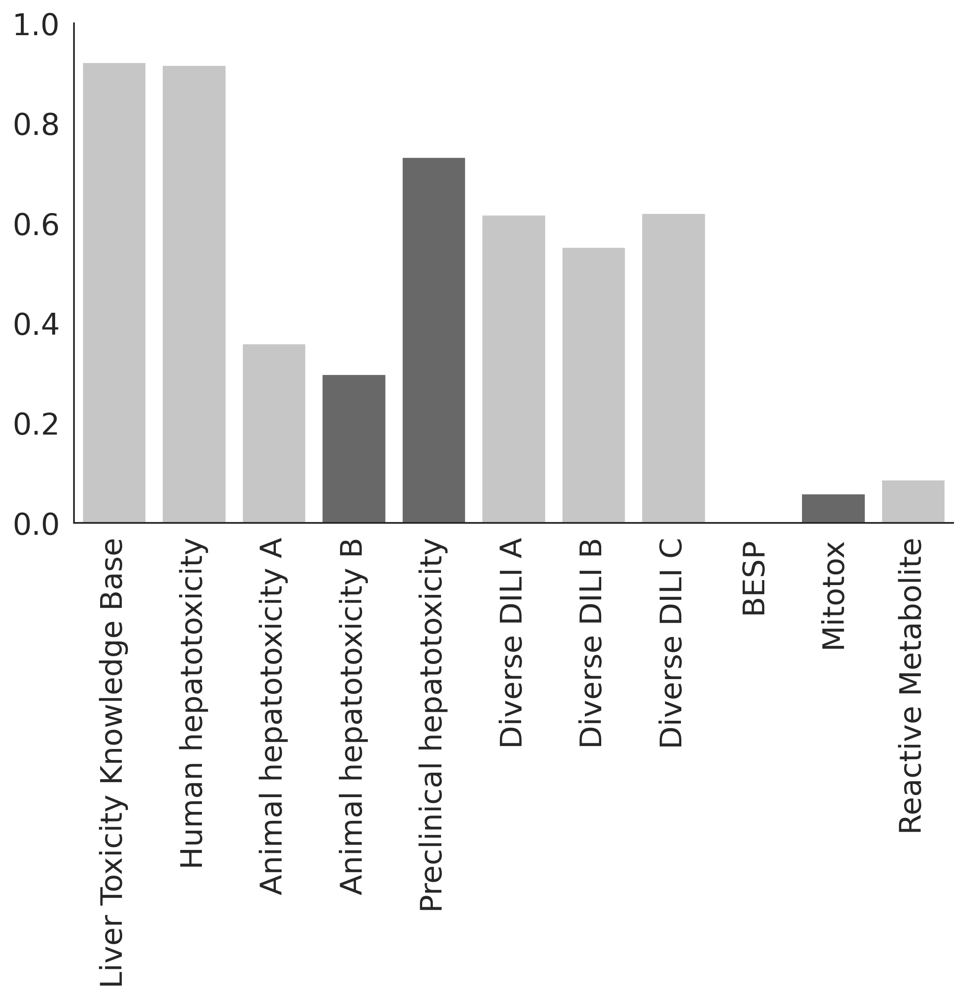

Minocycline
11


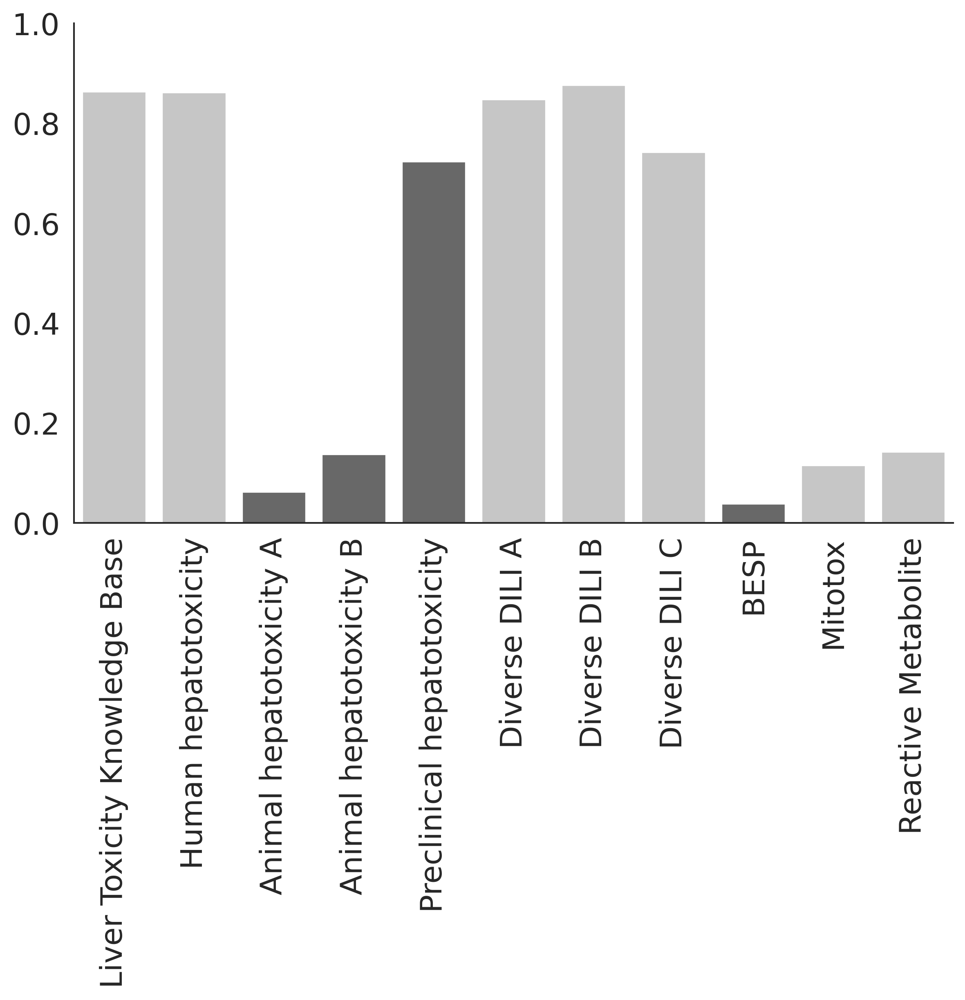

Moxifloxacin
11


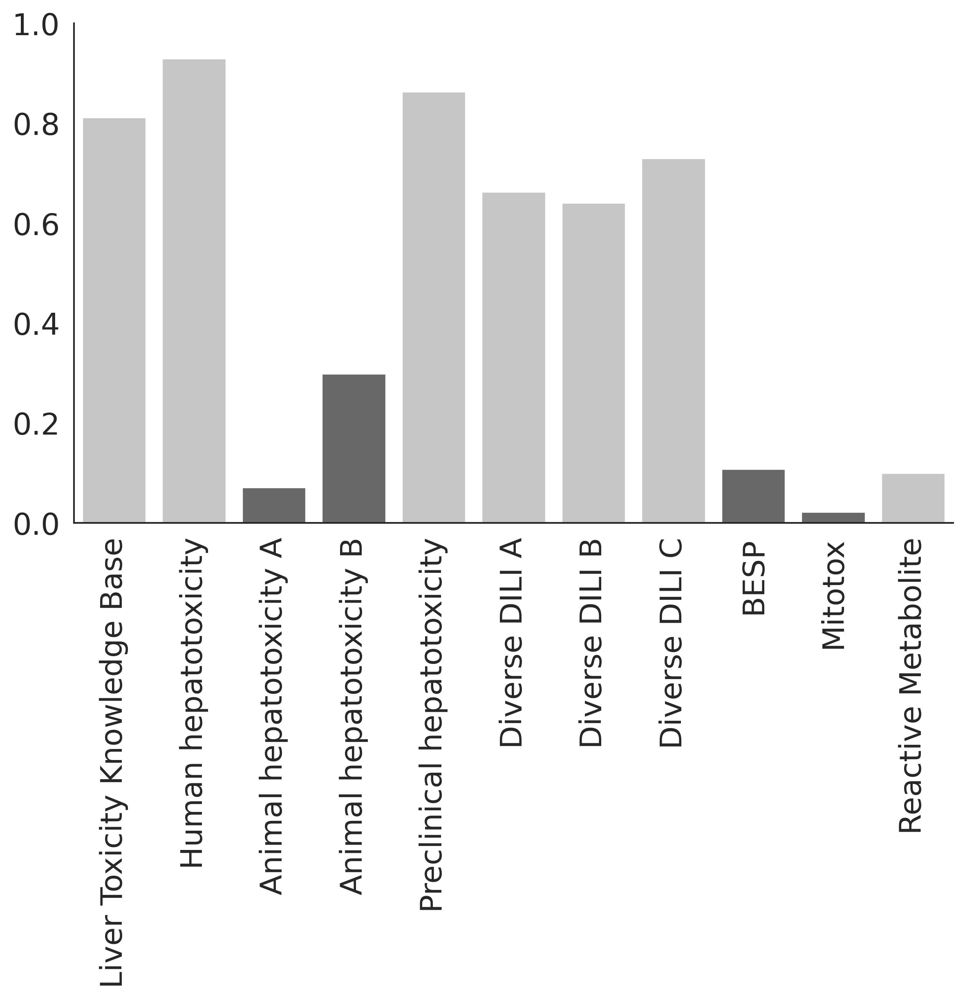

Paclitaxel
11


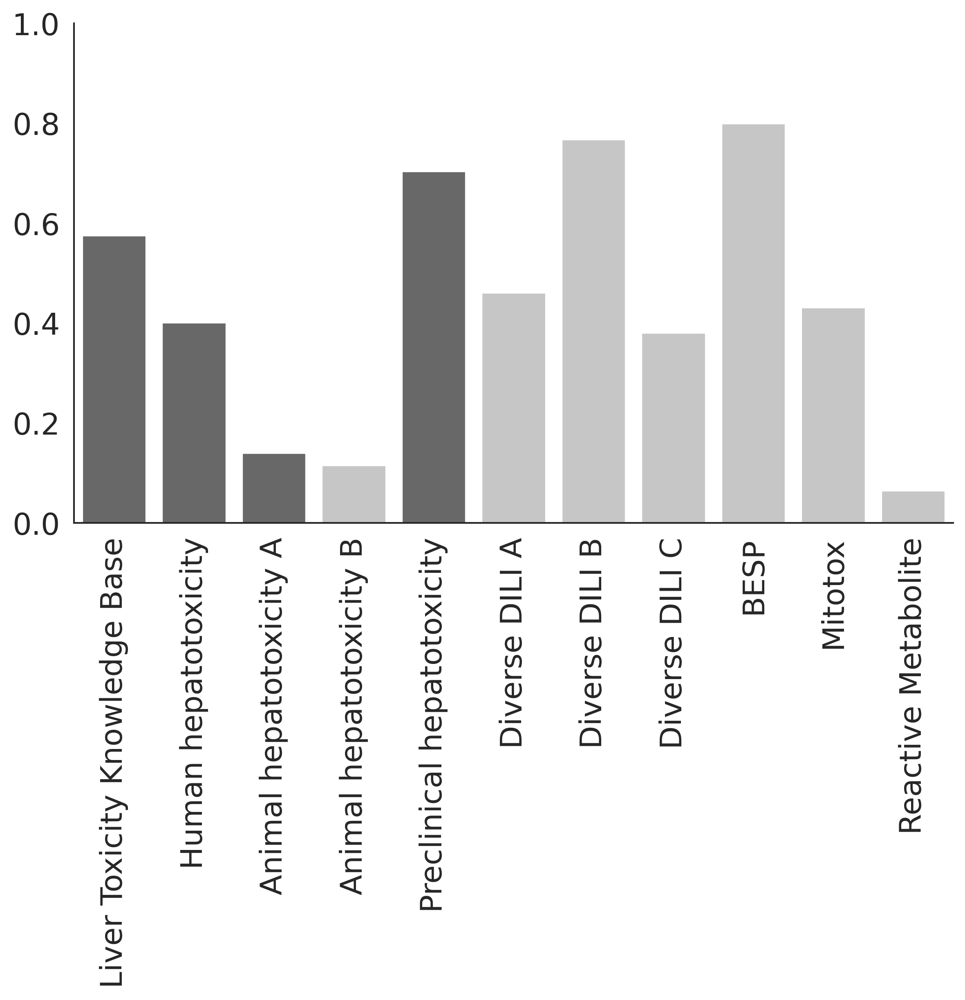

Sitaxentan
11


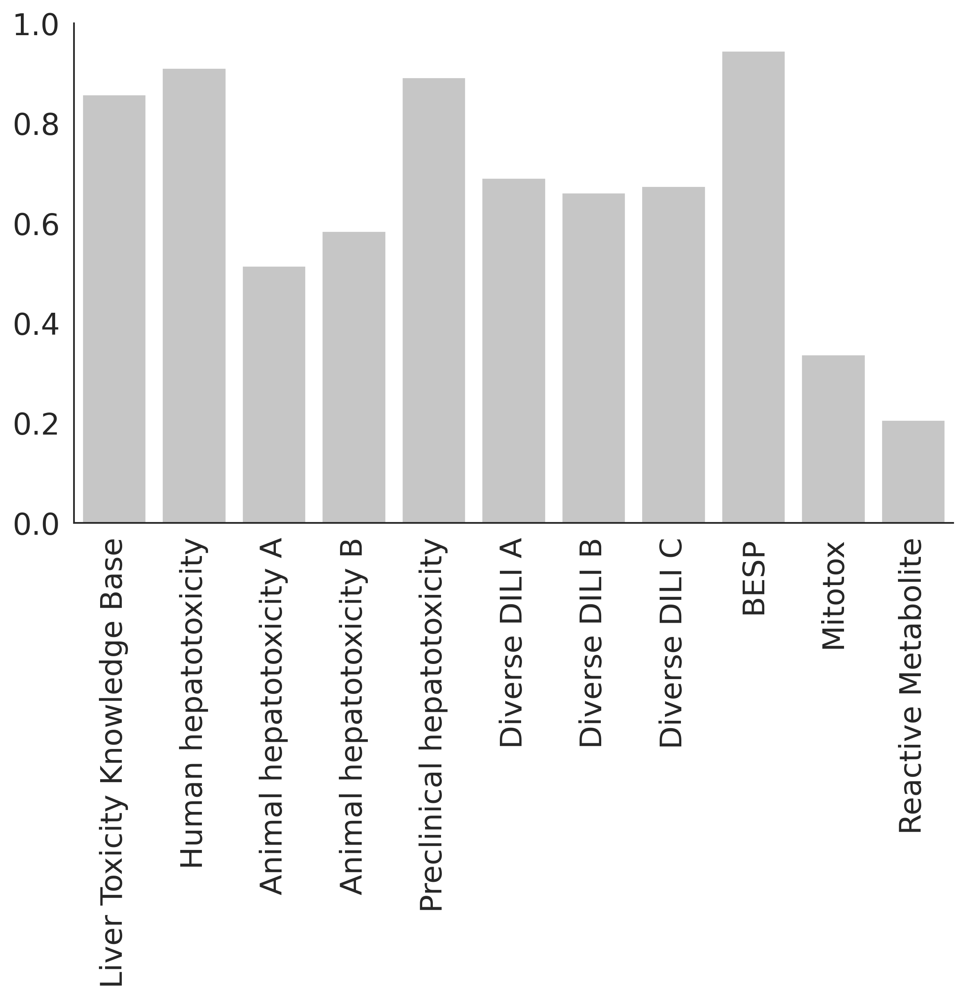

Trovafloxacin
11


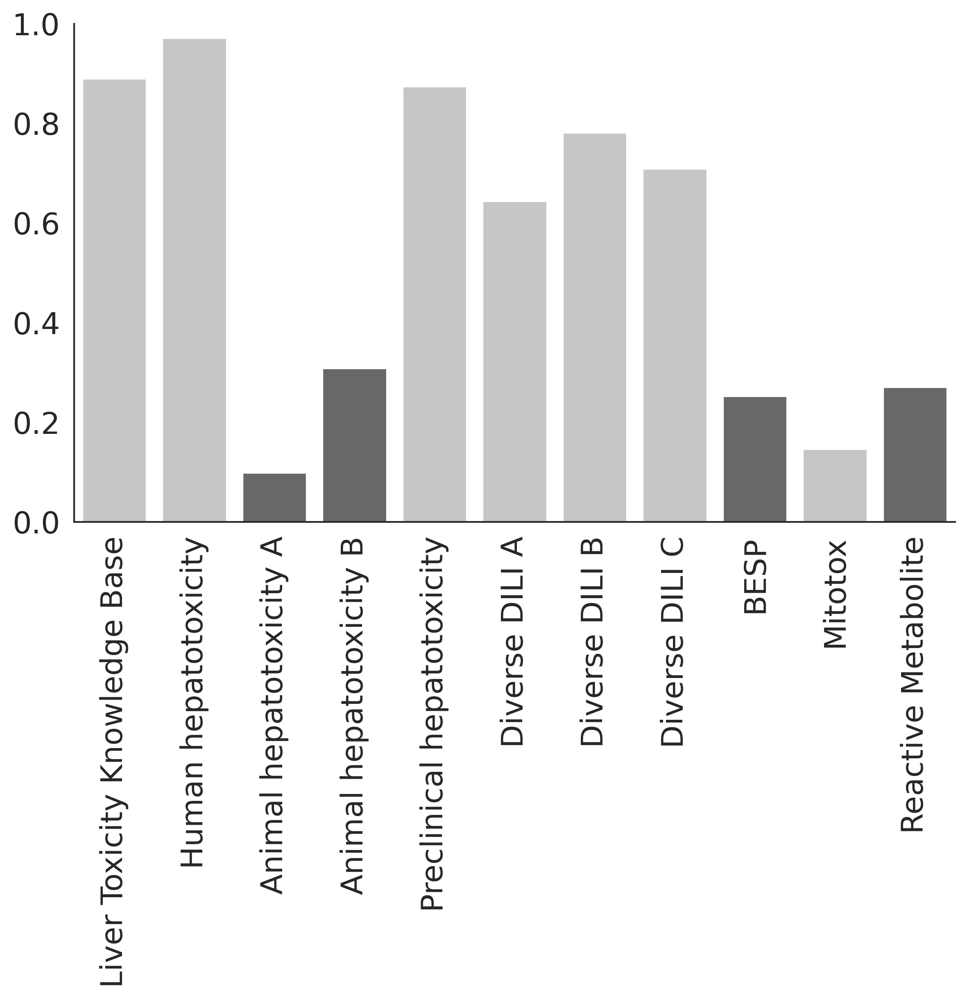

Ximelagatran
11


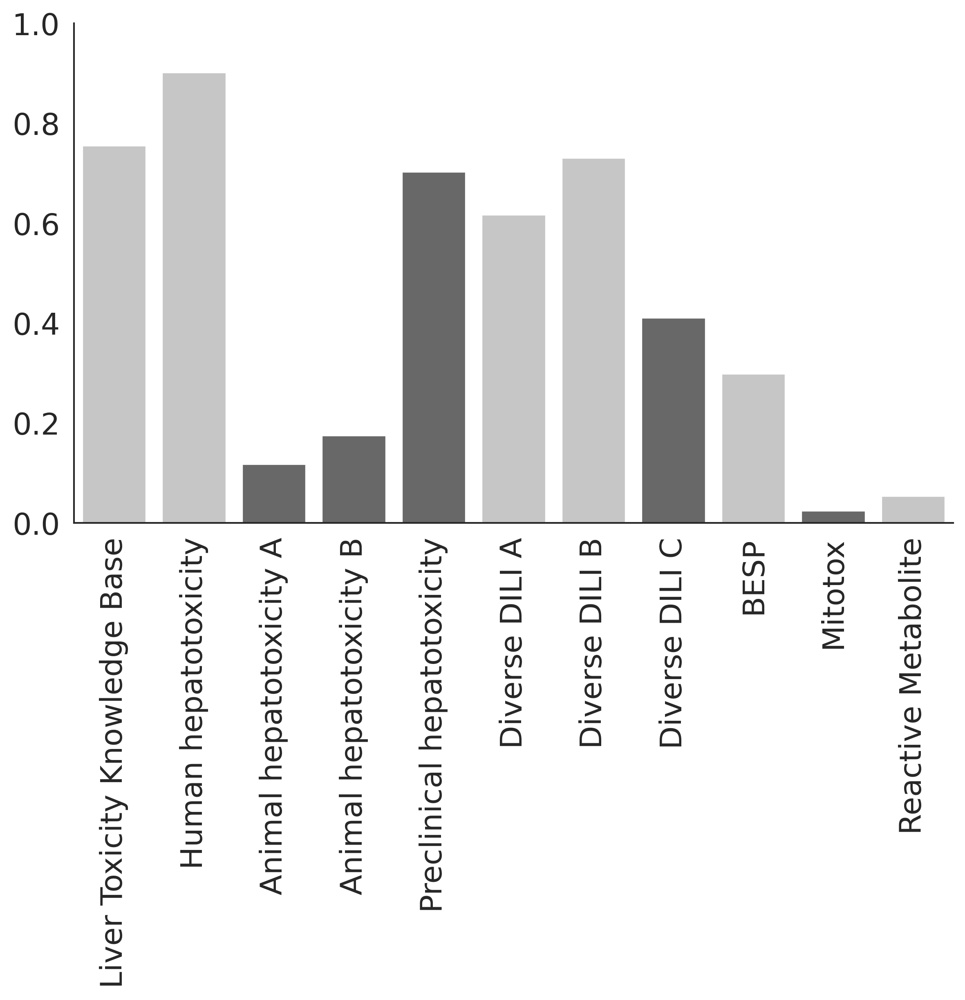

In [24]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

for compound_name in SHAP.compound.unique():
    print(compound_name)
    
    compound = SHAP[SHAP["compound"]==compound_name].sort_values(by=["name"], ascending=True)
    print(len(compound))
    

    #fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
    sns.set_style('white')
    sns.set_context('paper', font_scale=2)
    hue_order = ['Positive', 'Negative']
    #sns.barplot(data=compound, x="source", y="value", color='grey')
    g = sns.catplot(data=compound, x="source", y="value", kind="bar",hue_order=hue_order,  hue="SHAP contribution to Toxicity",  
                    palette="Greys", 
                    height=5, aspect=2, dodge=False, legend=False)
    #plt.axhline(y=0.5, color='r', linestyle='--')
    g.set_xticklabels(rotation=90)
    g.set(ylabel=None)
    g.set(xlabel=None)
    g.set(ylim=(0, 1))
    plt.show()

2-Butoxyethanol
11


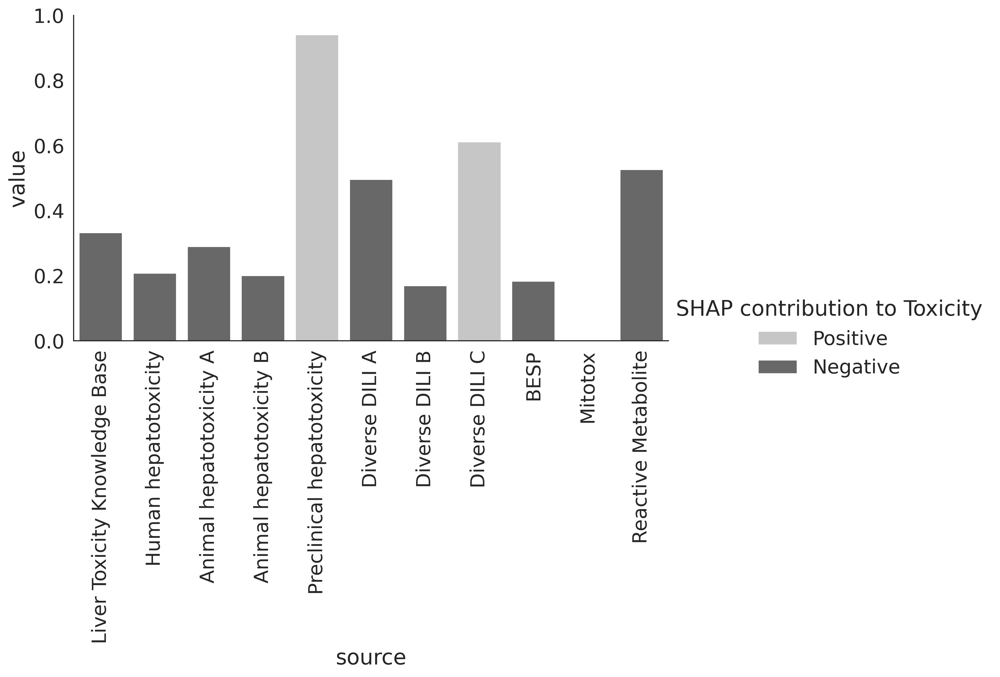

Acitretin
11


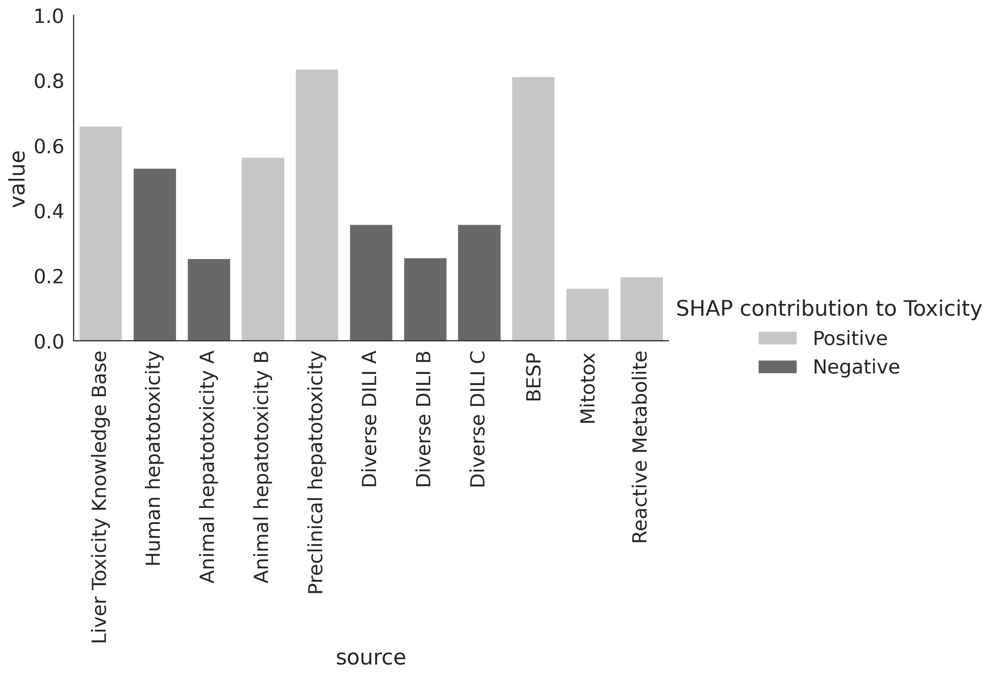

Astaxanthin
11


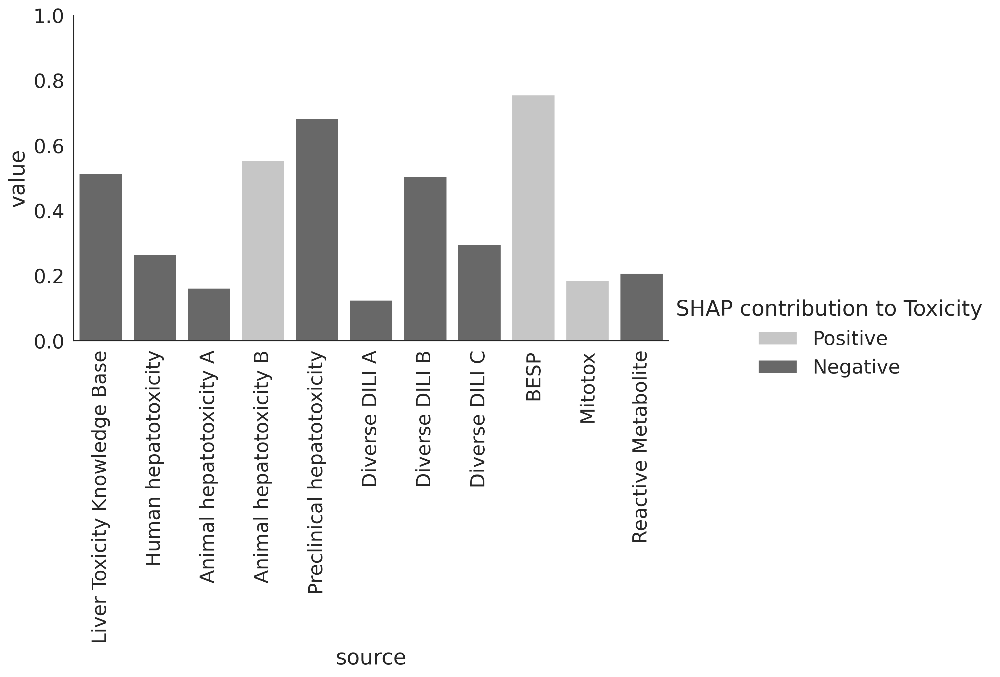

Cabazitaxel
11


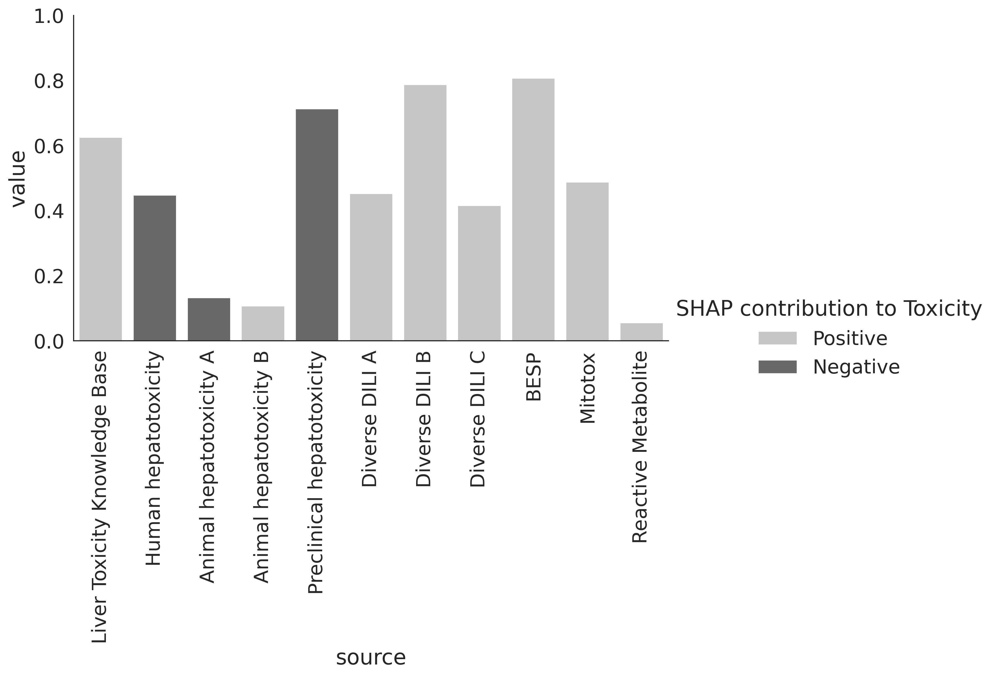

Clopidogrel
11


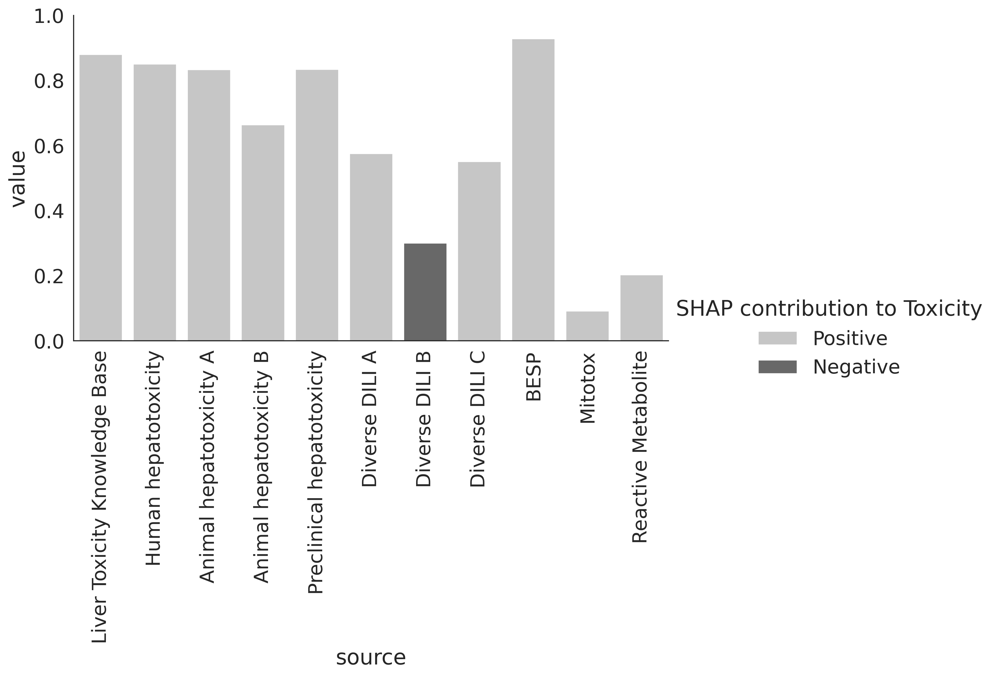

Docetaxel
11


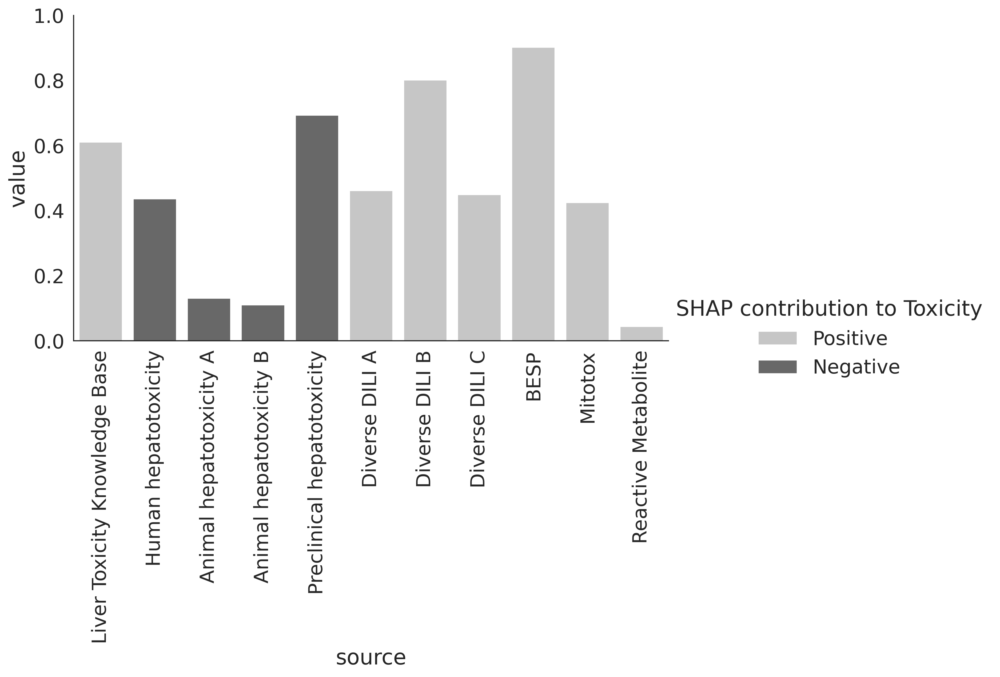

Doxycycline
11


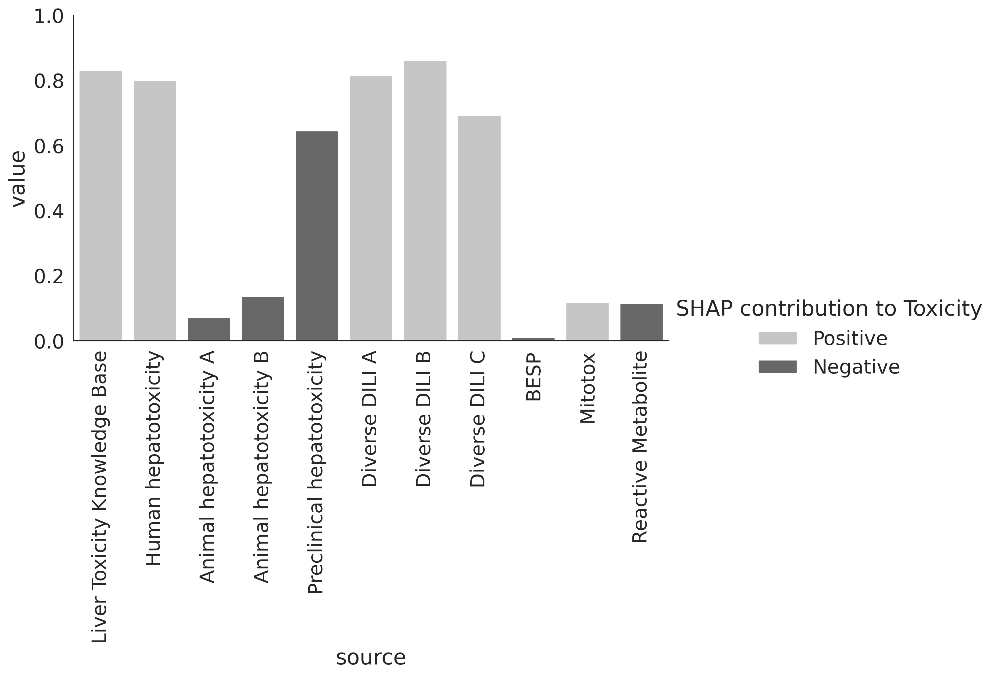

Entacapone
11


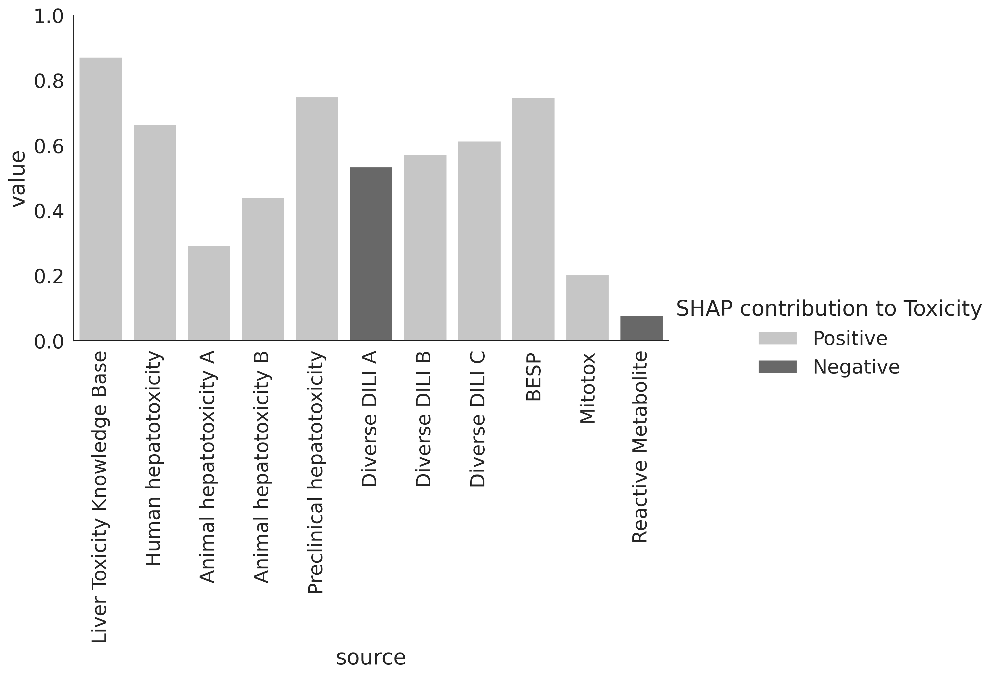

Enzalutamide
11


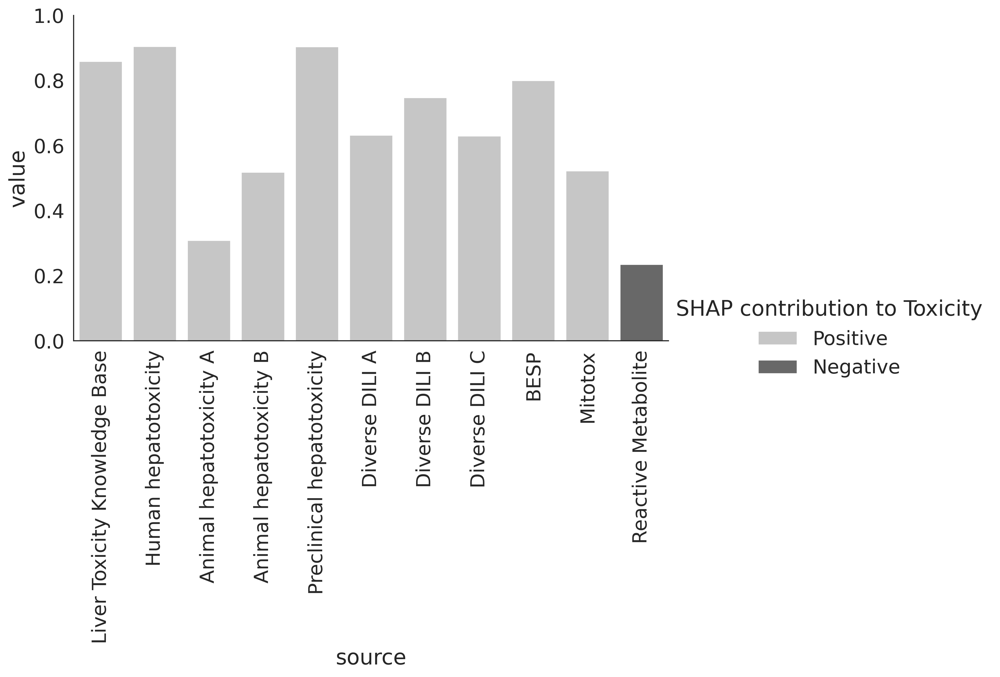

Gemcitabine
11


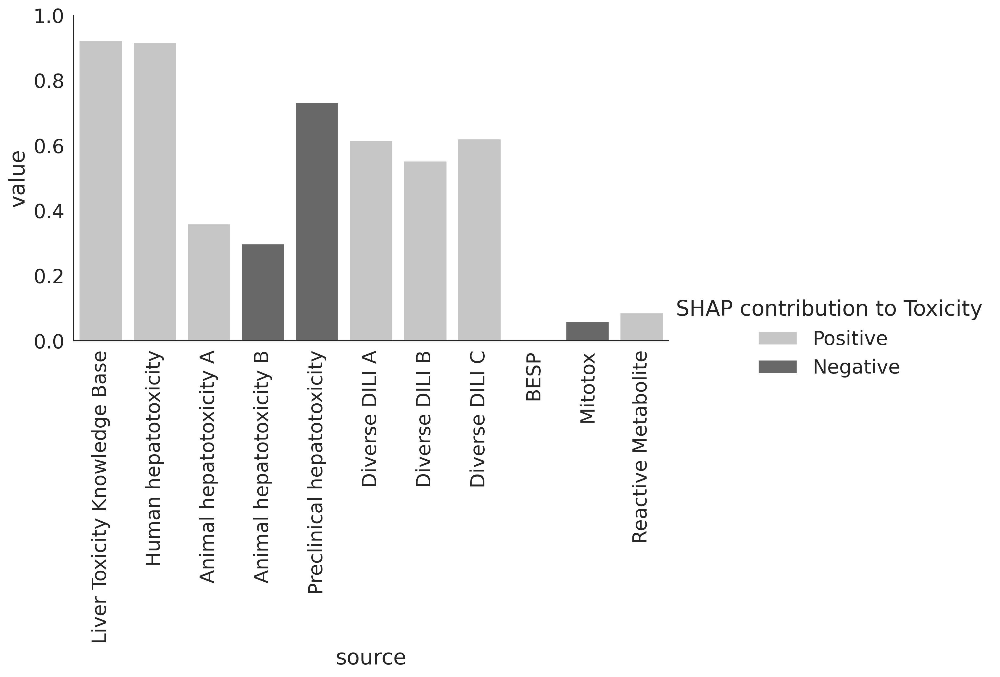

Minocycline
11


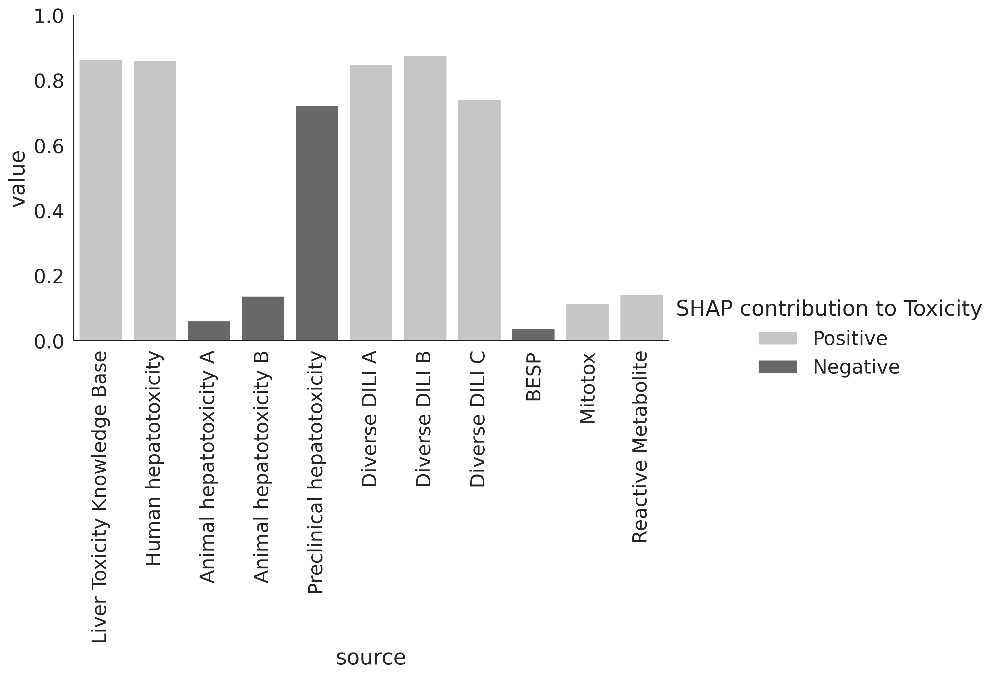

Moxifloxacin
11


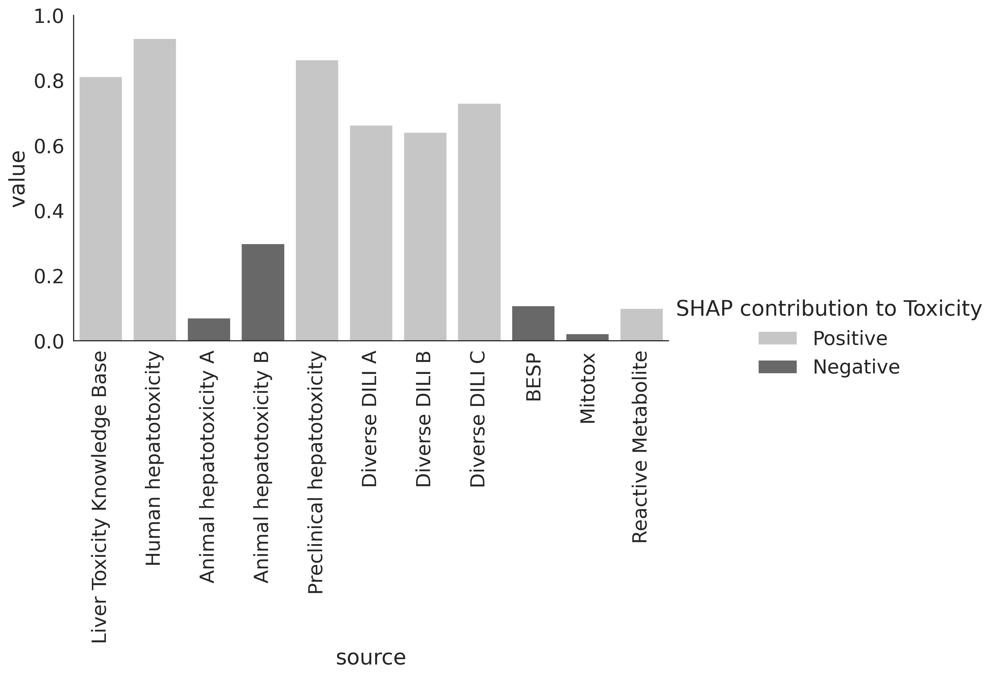

Paclitaxel
11


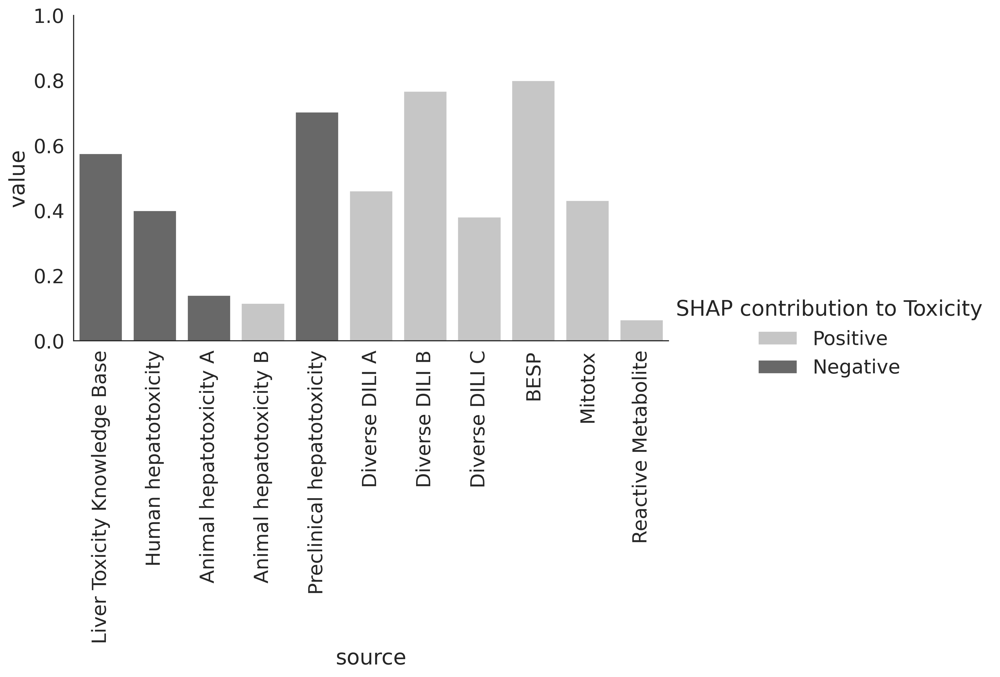

Sitaxentan
11


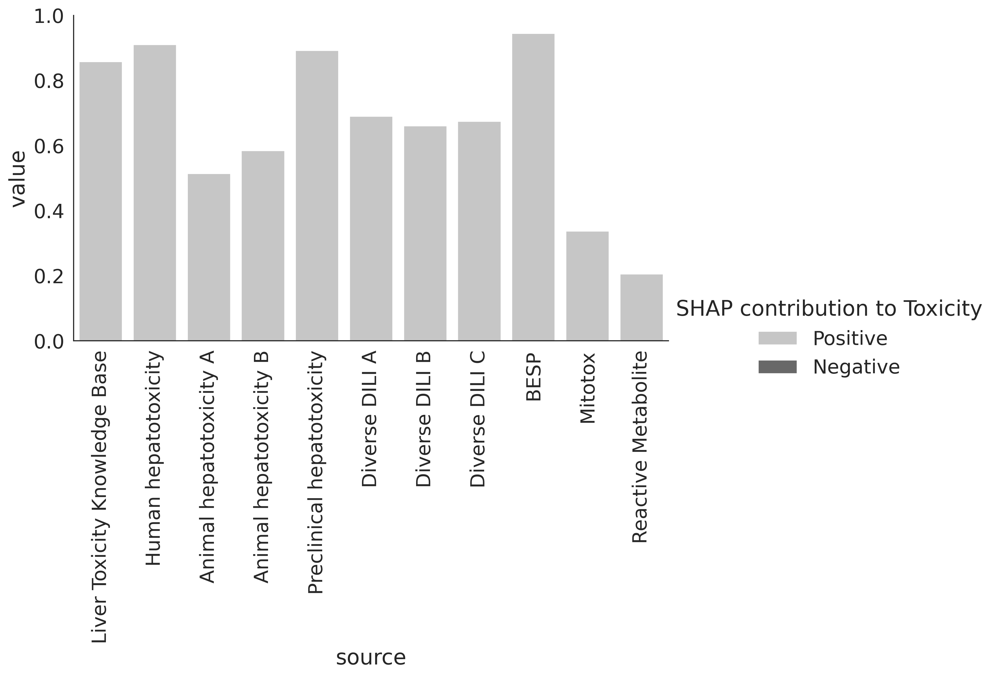

Trovafloxacin
11


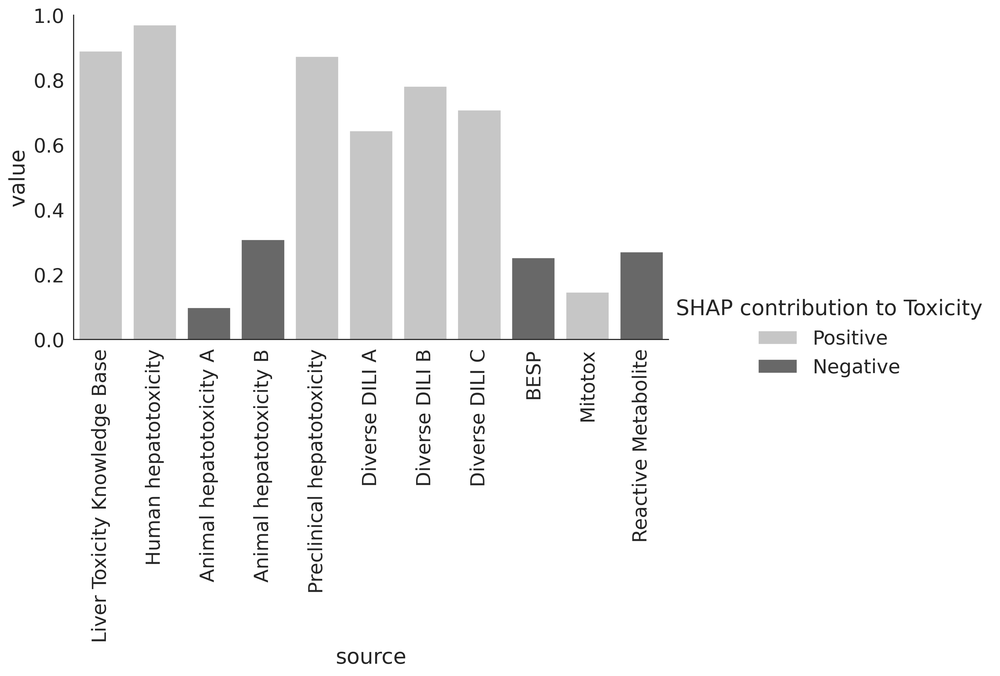

Ximelagatran
11


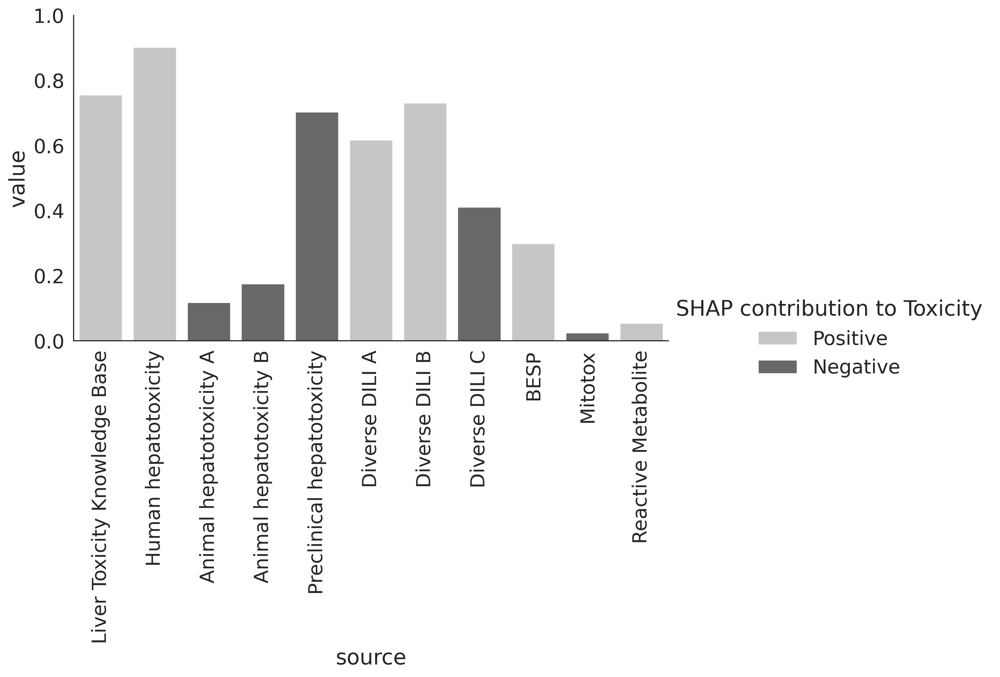

In [25]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

for compound_name in SHAP.compound.unique():
    print(compound_name)
    
    compound = SHAP[SHAP["compound"]==compound_name].sort_values(by=["name"], ascending=True)
    print(len(compound))
    

    #fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
    sns.set_style('white')
    sns.set_context('paper', font_scale=2)
    hue_order = ['Positive', 'Negative']
    #sns.barplot(data=compound, x="source", y="value", color='grey')
    g = sns.catplot(data=compound, x="source", y="value", kind="bar",hue_order=hue_order,  hue="SHAP contribution to Toxicity",  
                    palette="Greys", 
                    height=5, aspect=2, dodge=False)
    #plt.axhline(y=0.5, color='r', linestyle='--')
    g.set_xticklabels(rotation=90)
    g.set(ylim=(0, 1))
    plt.show()

In [26]:
compound = SHAP[SHAP["compound"]=="2-Butoxyethanol"].sort_values(by=["name"], ascending=True)
compound.sort_values(by="SHAP", ascending=False)

,name,source,assaytype,SHAP,description,value,pred,influence,smiles,SHAP contribution to Toxicity,compound
0,7,Preclinical hepatotoxicity,Animal hepatotoxicity,0.032516,Preclinical hepatotoxicity data from PharmaPen...,0.941045,True,NaN,CCCCOCCO,Positive,2-Butoxyethanol
1,11,Diverse DILI C,Heterogenous Data,0.00517,"Transient liver function abnormalities, advers...",0.612087,True,NaN,CCCCOCCO,Positive,2-Butoxyethanol
4,8,Diverse DILI A,Heterogenous Data,-0.000673,Large-scale and diverse ddrug induced liver in...,0.496632,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol
2,5,Animal hepatotoxicity A,Animal hepatotoxicity,-0.000809,"Rat, chronic oral administration, Hepatic hist...",0.290003,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol
8,16,Reactive Metabolite,Mechanisms of Liver Toxicity,-0.002765,Reactive Metabolite Formation,0.526413,True,NaN,CCCCOCCO,Negative,2-Butoxyethanol
3,6,Animal hepatotoxicity B,Animal hepatotoxicity,-0.00577,"Hepatocellular hypertrophy, rats, ORAD, HESS",0.20096,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol
6,14,BESP,Mechanisms of Liver Toxicity,-0.006261,BESP Bile Salt Export Pump Inhibition,0.183858,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol
7,15,Mitotox,Mechanisms of Liver Toxicity,-0.00922,Mitotox,0.000059,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol
5,10,Diverse DILI B,Heterogenous Data,-0.009957,"US drug-induced liver injury network (DILIN) ,...",0.16936,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol
1,3,Human hepatotoxicity,Human hepatotoxicity,-0.025325,"Human hepatotoxicity, hepatobiallry",0.208494,False,NaN,CCCCOCCO,Negative,2-Butoxyethanol


In [27]:
for name in SHAP["compound"].unique():
    print(name)
    compound = SHAP[SHAP["compound"]==name].sort_values(by=["name"], ascending=True)
    pos= compound[compound["SHAP"]>0].sort_values(by="SHAP", ascending=False)
    neg = compound[compound["SHAP"]<0].sort_values(by="SHAP", ascending=True)
    
    #print(compound)
    
    if (name=="2-Butoxyethanol"):
    
        print(neg.source.to_list()[:3])
        
    elif (name=="Astaxanthin"):  
        
        print(neg.source.to_list()[:3])
        
    else:
        
        print(pos.source.to_list()[:3])

2-Butoxyethanol
['Liver Toxicity Knowledge Base', 'Human hepatotoxicity', 'Diverse DILI B']
Acitretin
['Preclinical hepatotoxicity', 'Mitotox', 'BESP']
Astaxanthin
['Human hepatotoxicity', 'Preclinical hepatotoxicity', 'Diverse DILI A']
Cabazitaxel
['Diverse DILI B', 'Mitotox', 'BESP']
Clopidogrel
['Preclinical hepatotoxicity', 'Liver Toxicity Knowledge Base', 'Human hepatotoxicity']
Docetaxel
['Diverse DILI B', 'Mitotox', 'BESP']
Doxycycline
['Liver Toxicity Knowledge Base', 'Diverse DILI B', 'Diverse DILI A']
Entacapone
['Preclinical hepatotoxicity', 'Liver Toxicity Knowledge Base', 'Diverse DILI B']
Enzalutamide
['Preclinical hepatotoxicity', 'Liver Toxicity Knowledge Base', 'Diverse DILI B']
Gemcitabine
['Liver Toxicity Knowledge Base', 'Diverse DILI A', 'Diverse DILI B']
Minocycline
['Liver Toxicity Knowledge Base', 'Diverse DILI B', 'Diverse DILI A']
Moxifloxacin
['Preclinical hepatotoxicity', 'Liver Toxicity Knowledge Base', 'Diverse DILI B']
Paclitaxel
['Diverse DILI B', 'Mitot

In [28]:
compound.source.to_list()[-3:]

['BESP', 'Mitotox', 'Reactive Metabolite']

In [29]:
maccsshap = pd.DataFrame(list_of_lists, columns=["SMILES", "name", "topMACCS", "bottomMACCS"])
maccsshap

,SMILES,name,topMACCS,bottomMACCS
0,CCCCOCCO,2-Butoxyethanol,"[$([!#6;!#1;!H0]~*~*~*~[CH2]~*),$([!#6;!#1;!H0...","[$(*~[CH2]~*~*~*~[CH2]~*),$([R]1@[CH2;R]@[R]@[..."
1,COc1cc(C)c(/C=C/C(C)=C/C=C/C(C)=C/C(=O)O)c(C)c1C,Acitretin,[#6]=[#6](~[#6])~[#6],[!#6;!#1]~[CH3]
2,CC1=C(/C=C/C(C)=C/C=C/C(C)=C/C=C/C=C(C)/C=C/C=...,Astaxanthin,[#6]=[#6](~[#6])~[#6],*~*(~*)(~*)~*
3,CO[C@H]1C(=O)[C@]2(C)[C@@H](OC)C[C@H]3OC[C@@]3...,Cabazitaxel,*!@*@*!@*,*~*(~*)(~*)~*
4,COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1,Clopidogrel,*!@*@*!@*,[#6]~[#7](~[#6])~[#6]
5,CC(=O)O[C@@]12CO[C@@H]1C[C@H](O)[C@@]1(C)C(=O)...,Docetaxel,*!@*@*!@*,*~*(~*)(~*)~*
6,C[C@H]1c2cccc(O)c2C(=O)C2=C(O)[C@]3(O)C(=O)C(C...,Doxycycline,*!@*@*!@*,[!#6;!#1;!H0]~*~*~[!#6;!#1;!H0]
7,CCN(CC)C(=O)/C(C#N)=C/c1cc(O)c(O)c([N+](=O)[O-...,Entacapone,*!@*@*!@*,[!#6;!#1;!H0]~*~*~[!#6;!#1;!H0]
8,CNC(=O)c1ccc(N2C(=S)N(c3ccc(C#N)c(C(F)(F)F)c3)...,Enzalutamide,*!@*@*!@*,[#6]~[#7](~[#6])~[#6]
9,Nc1ccn([C@@H]2O[C@H](CO)[C@@H](O)C2(F)F)c(=O)n1,Gemcitabine,*!@*@*!@*,[#6]~[#7](~[#6])~[#6]


2-Butoxyethanol
[$([!#6;!#1;!H0]~*~*~*~[CH2]~*),$([!#6;!#1;!H0;R]1@[R]@[R]@[R]@[CH2;R]1),$([!#6;!#1;!H0]~[R]1@[R]@[R]@[CH2;R]1),$([!#6;!#1;!H0]~*~[R]1@[R]@[CH2;R]1)]


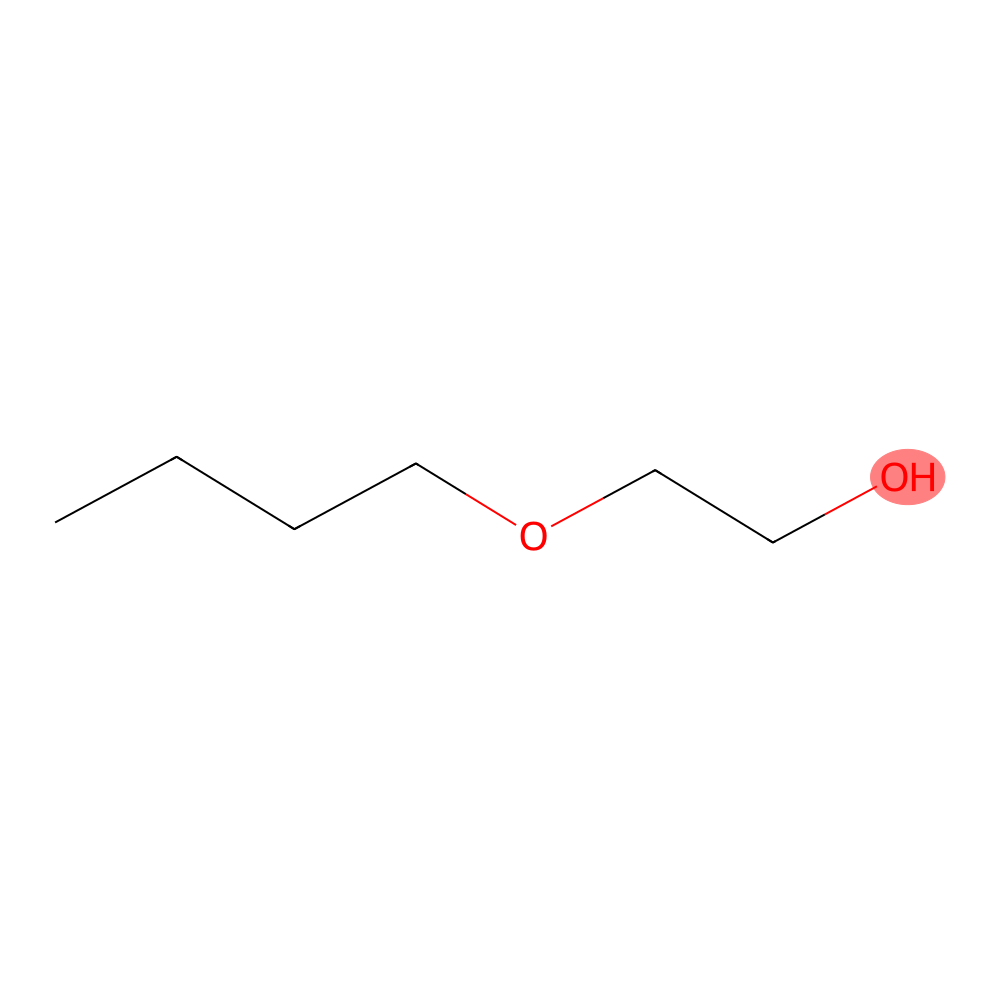

Acitretin
[#6]=[#6](~[#6])~[#6]


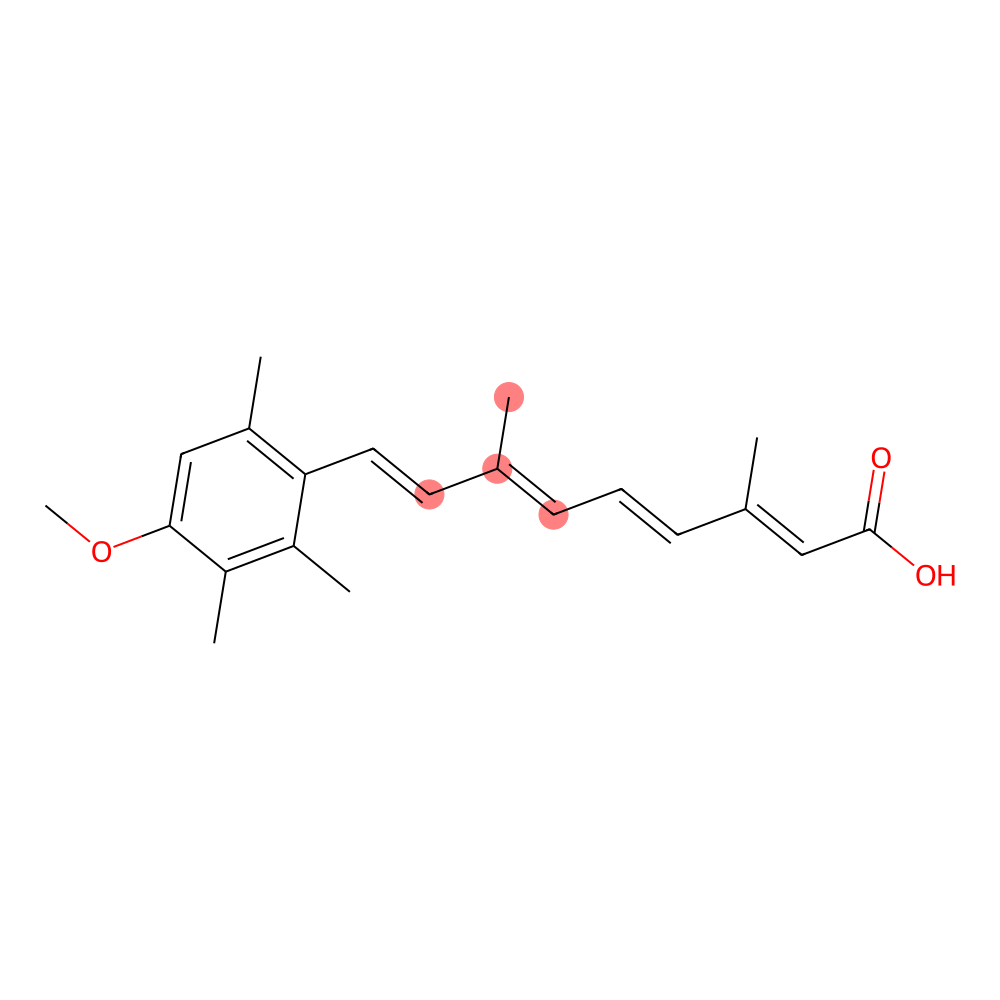

Astaxanthin
[#6]=[#6](~[#6])~[#6]


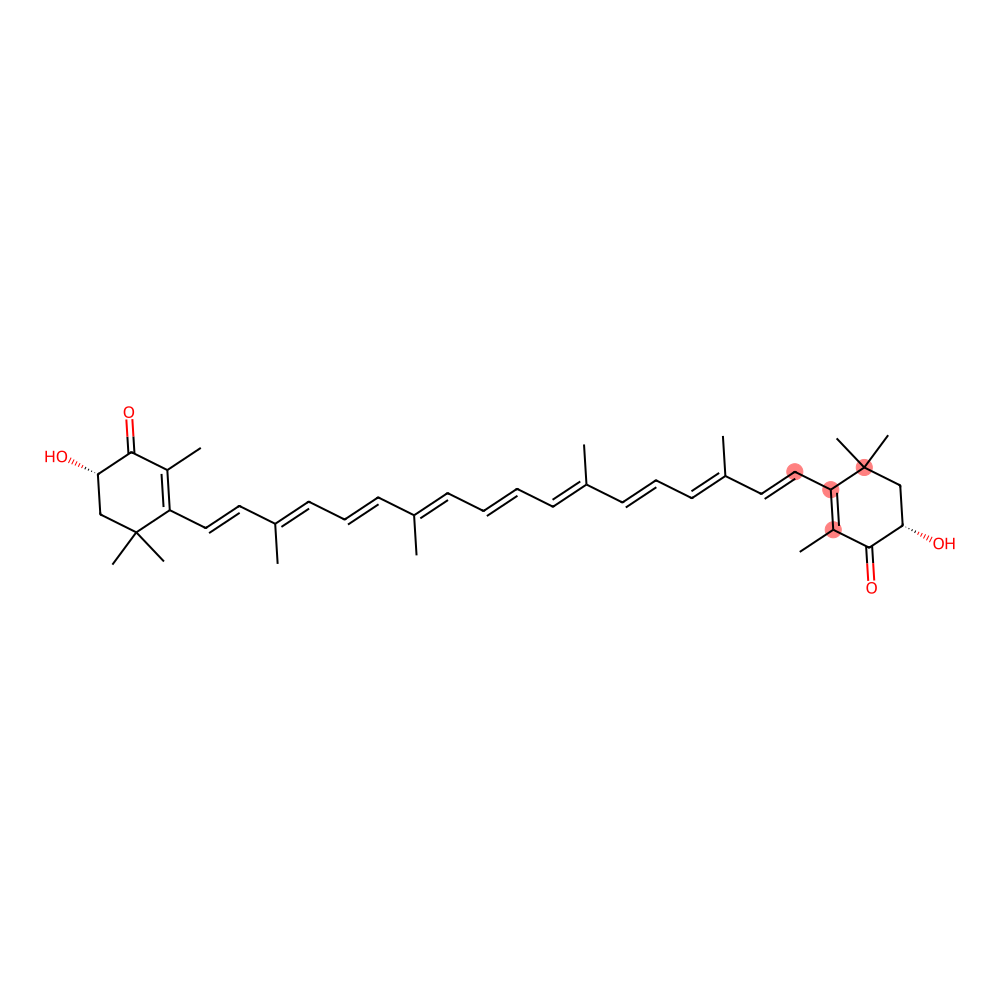

Cabazitaxel
*!@*@*!@*


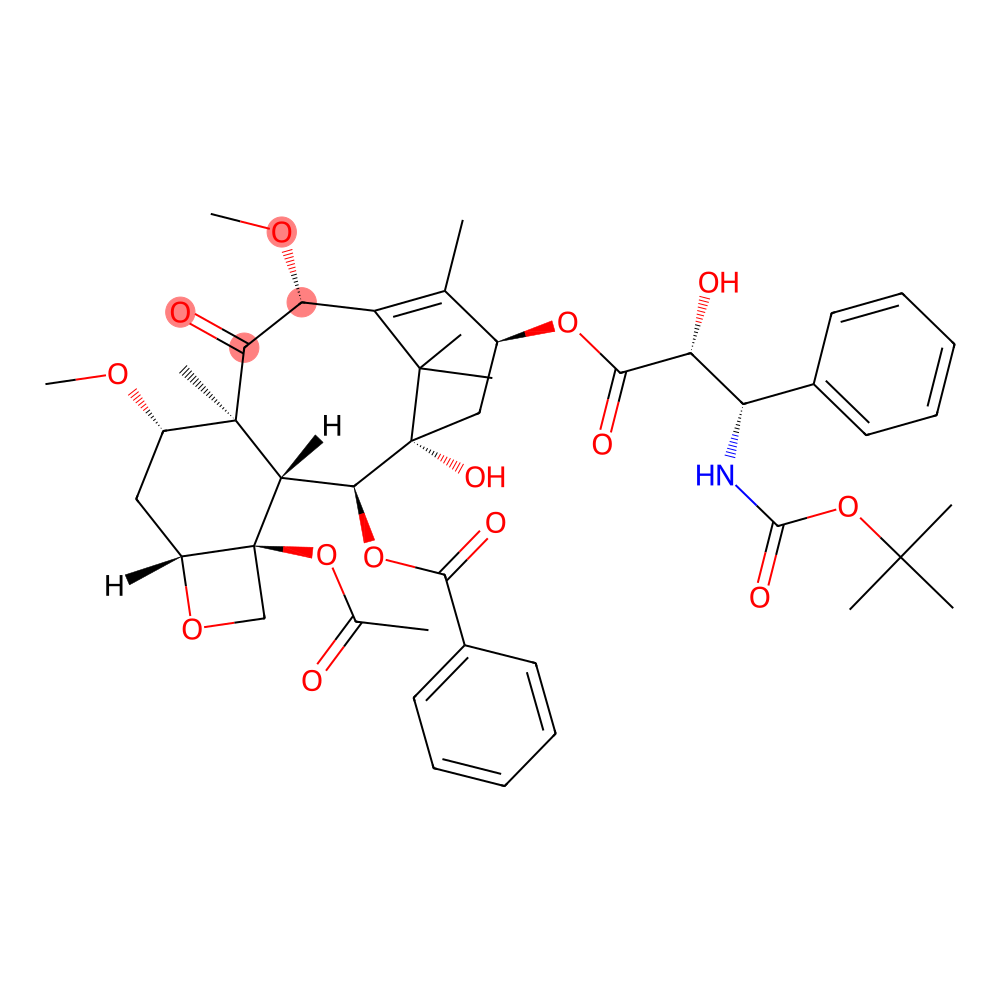

Clopidogrel
*!@*@*!@*


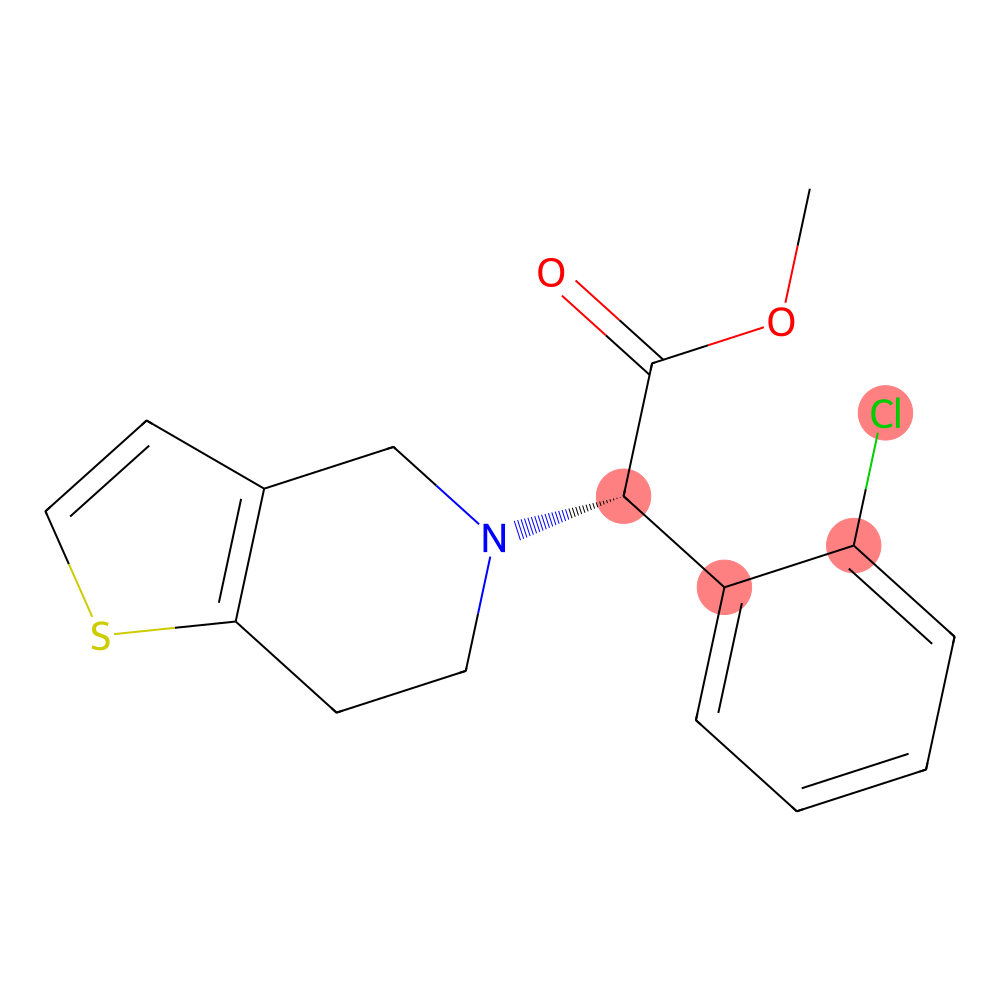

Docetaxel
*!@*@*!@*


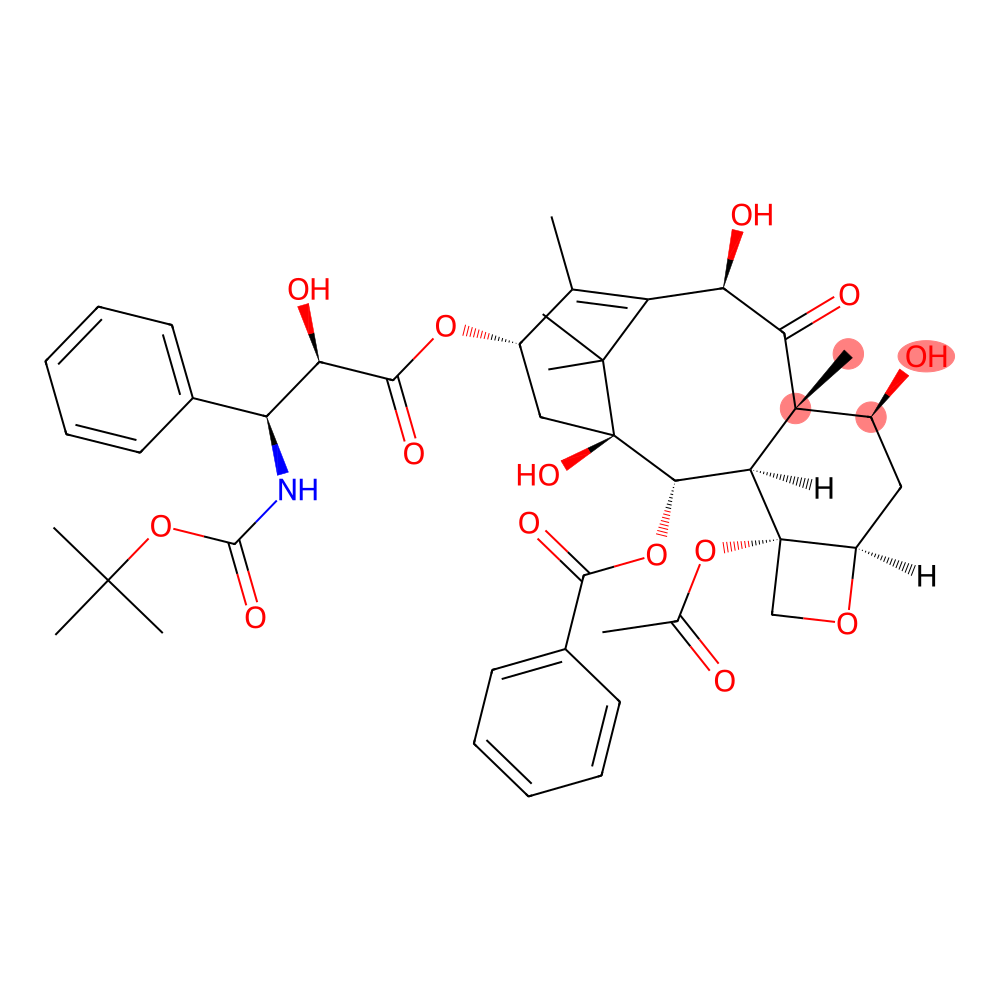

Doxycycline
*!@*@*!@*


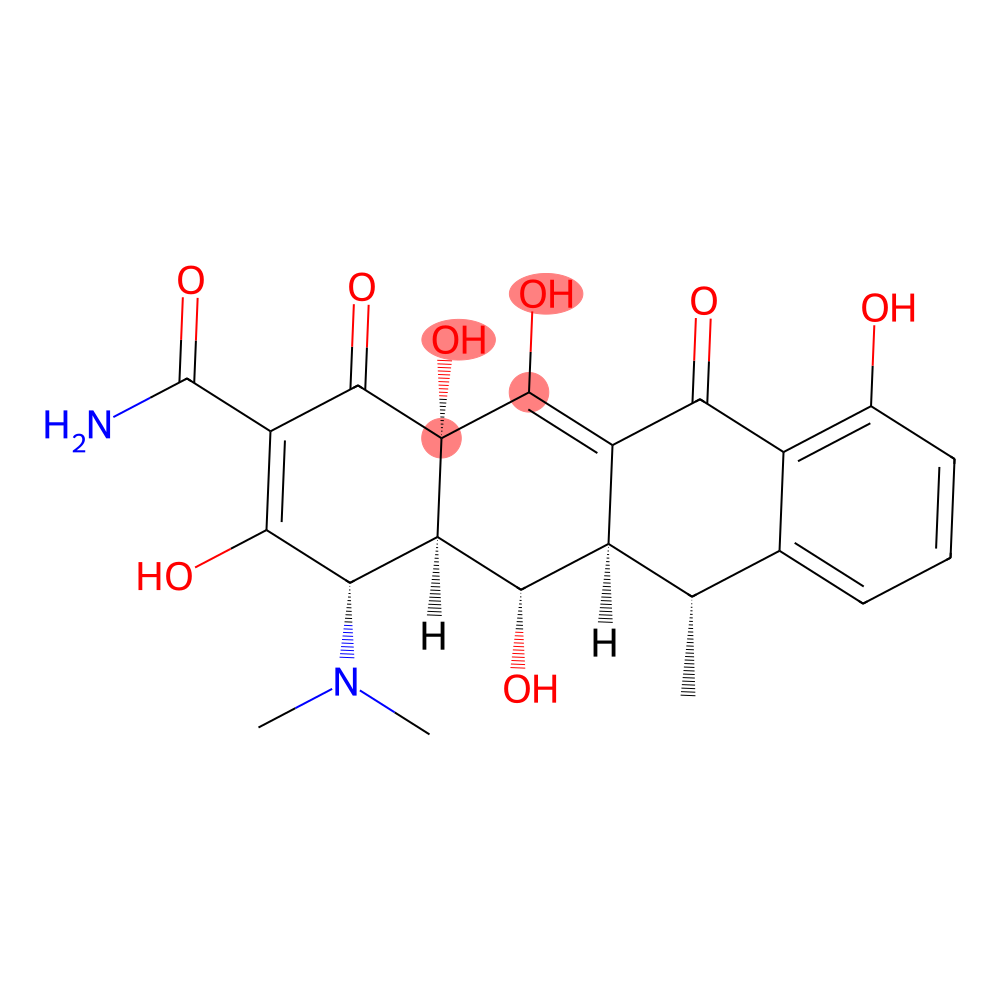

Entacapone
*!@*@*!@*


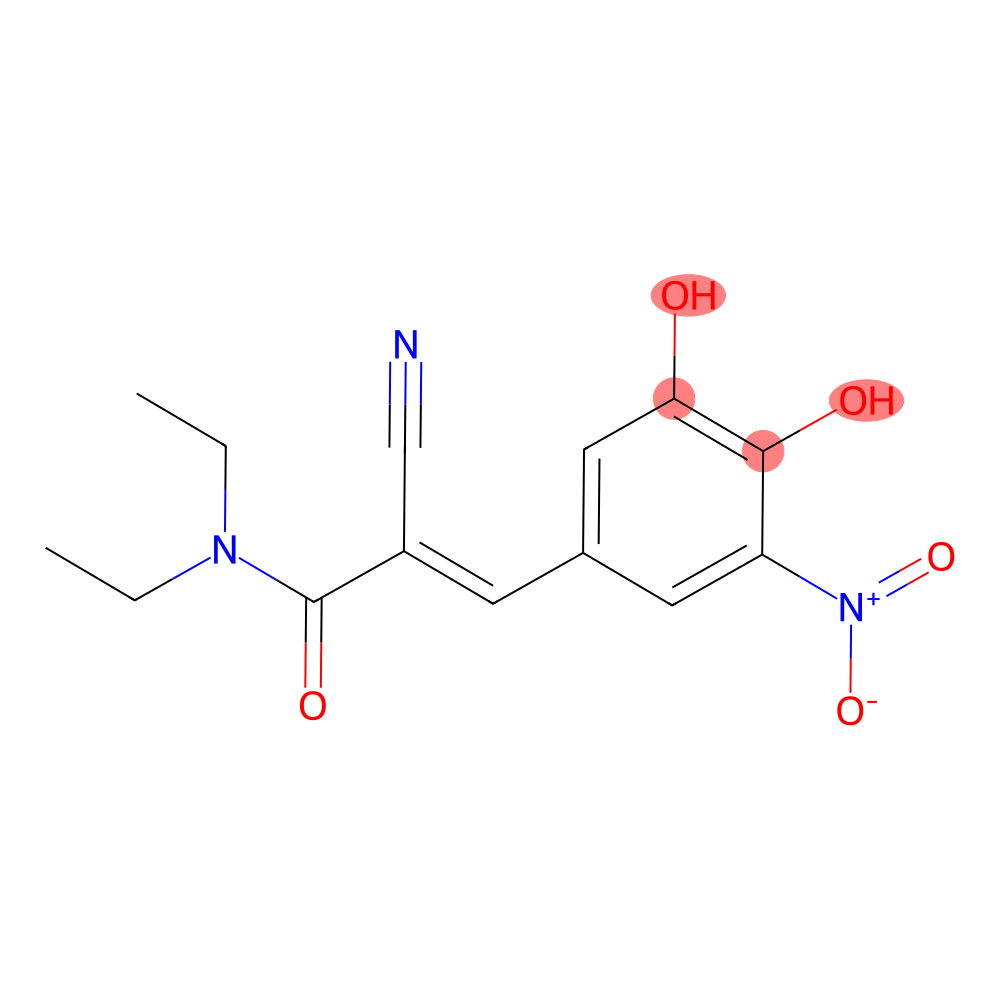

Enzalutamide
*!@*@*!@*


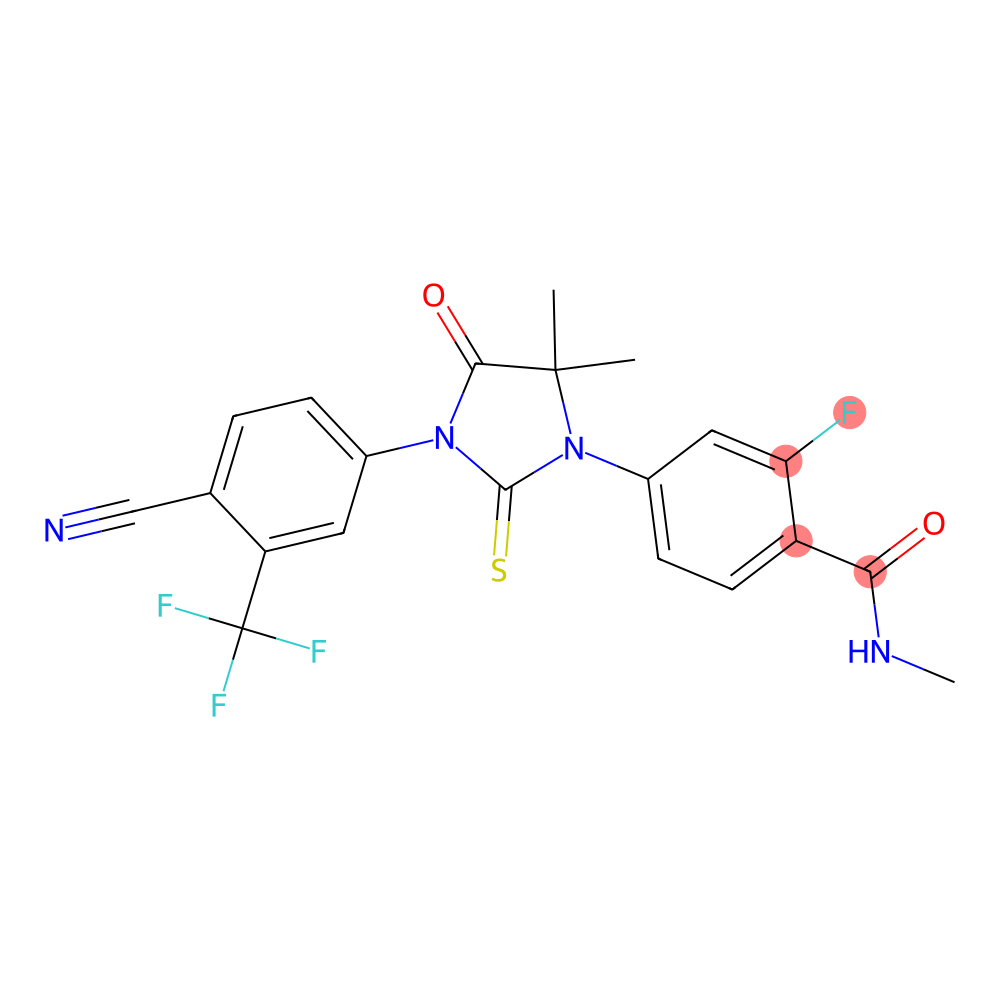

Gemcitabine
*!@*@*!@*


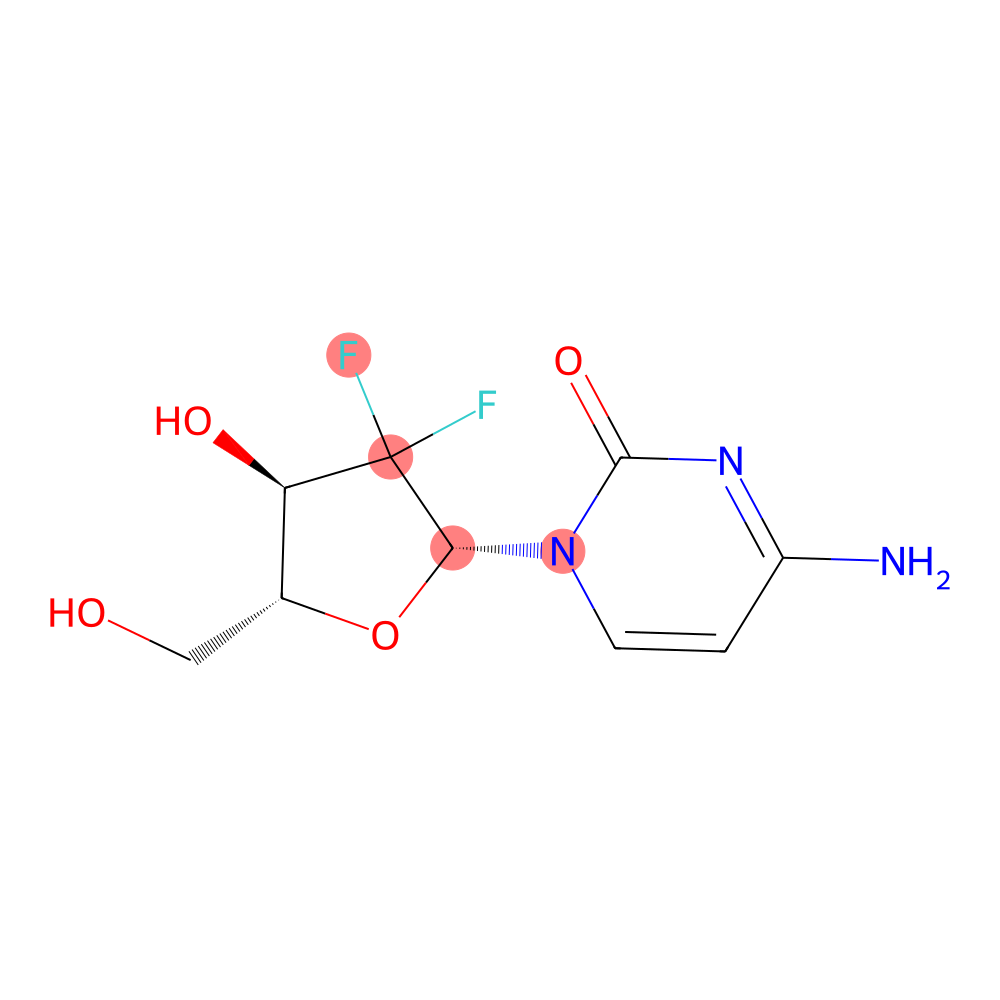

Minocycline
*!@*@*!@*


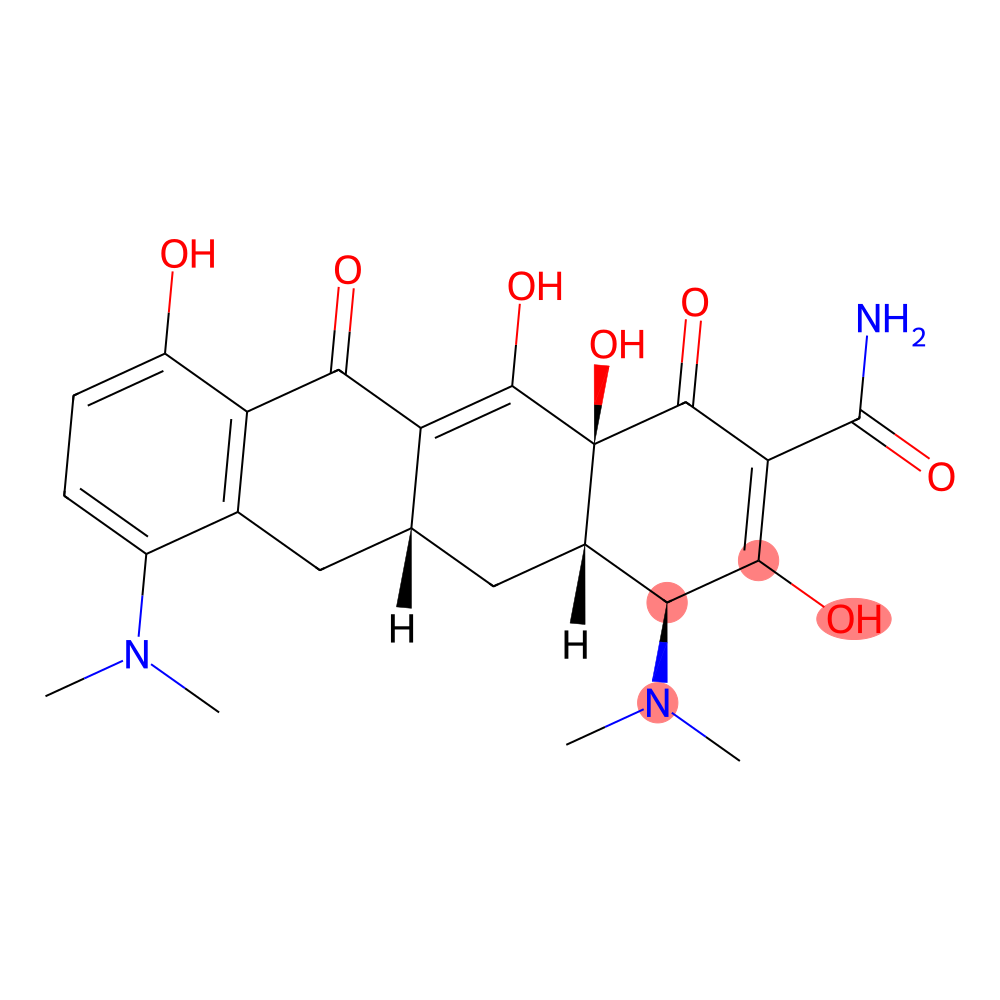

Moxifloxacin
*!@*@*!@*


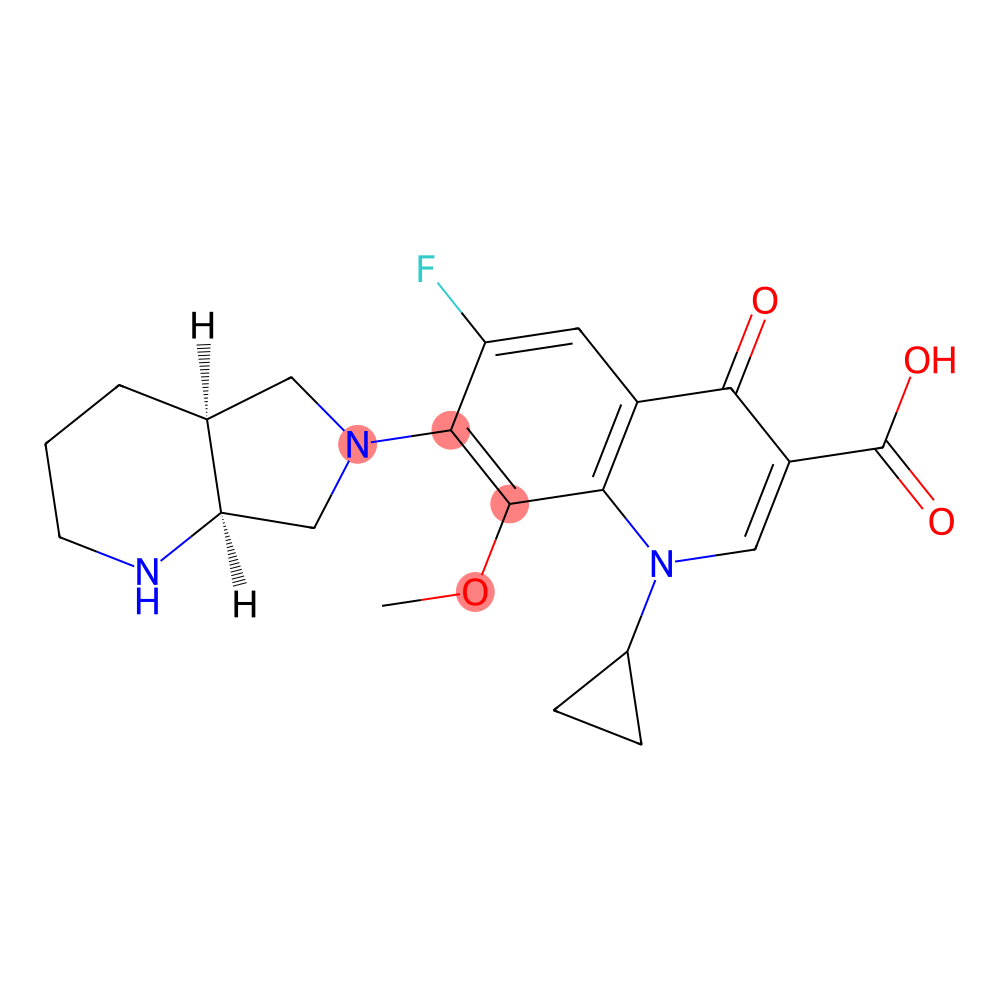

Paclitaxel
*!@*@*!@*


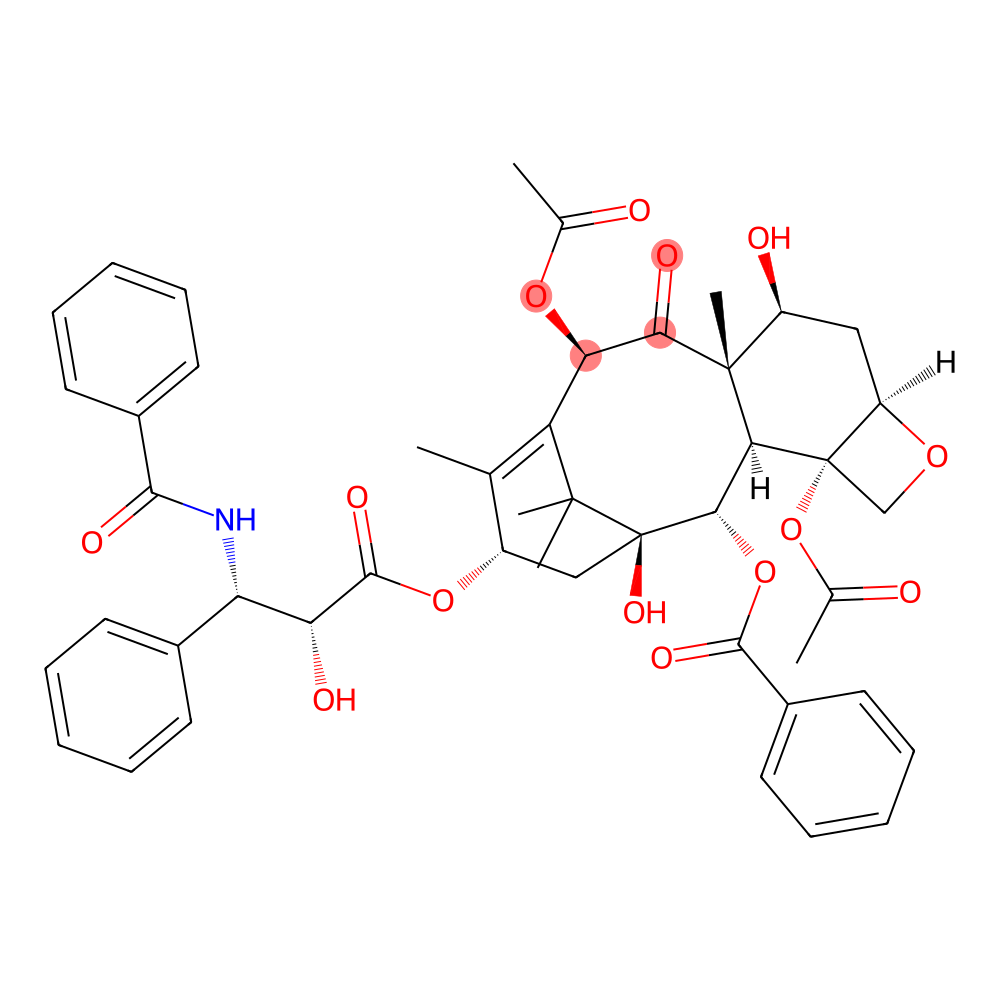

Sitaxentan
*!@*@*!@*


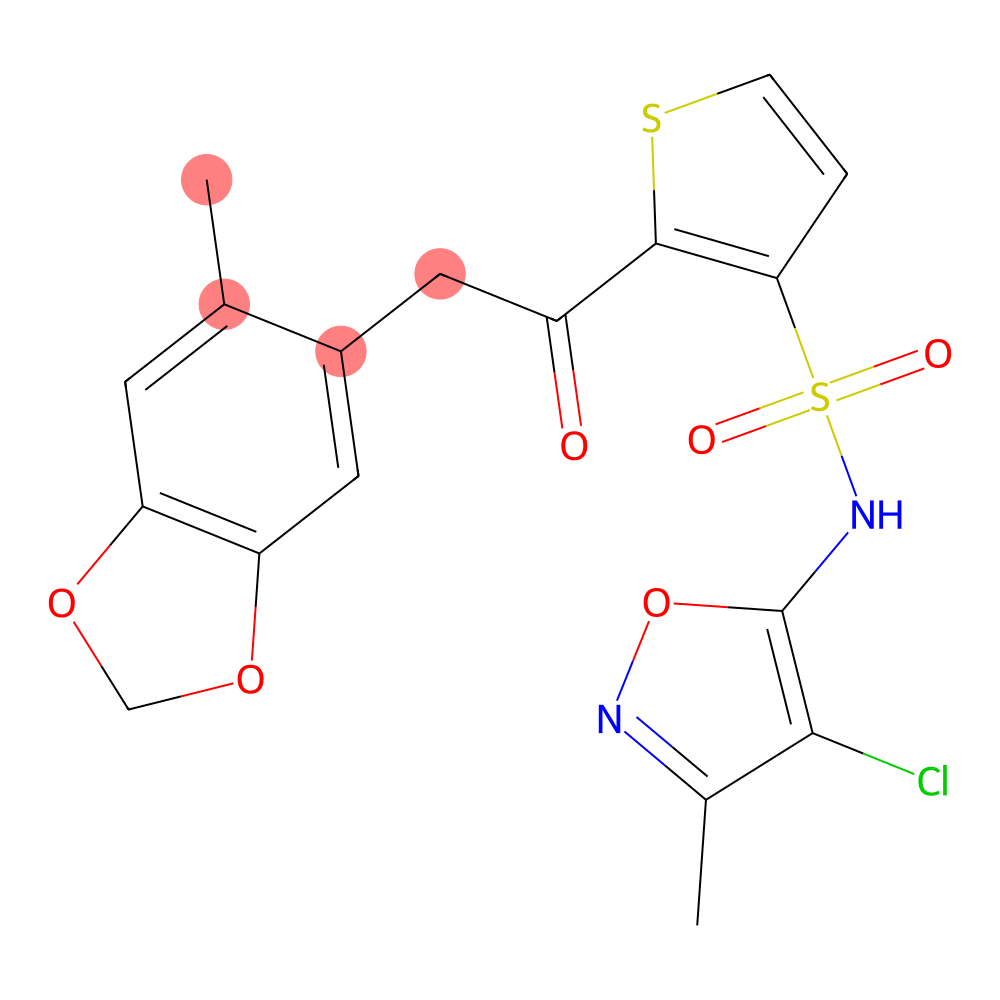

Trovafloxacin
*!@*@*!@*


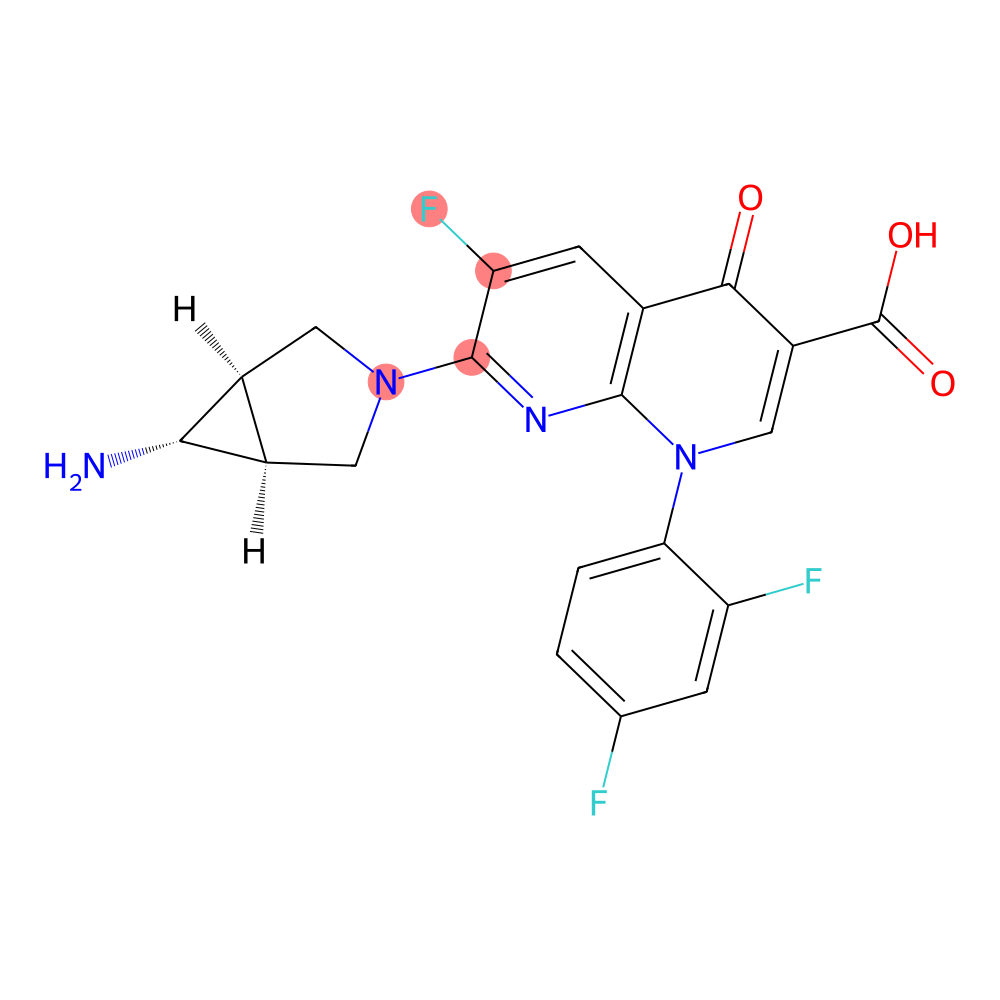

Ximelagatran
*!@*@*!@*


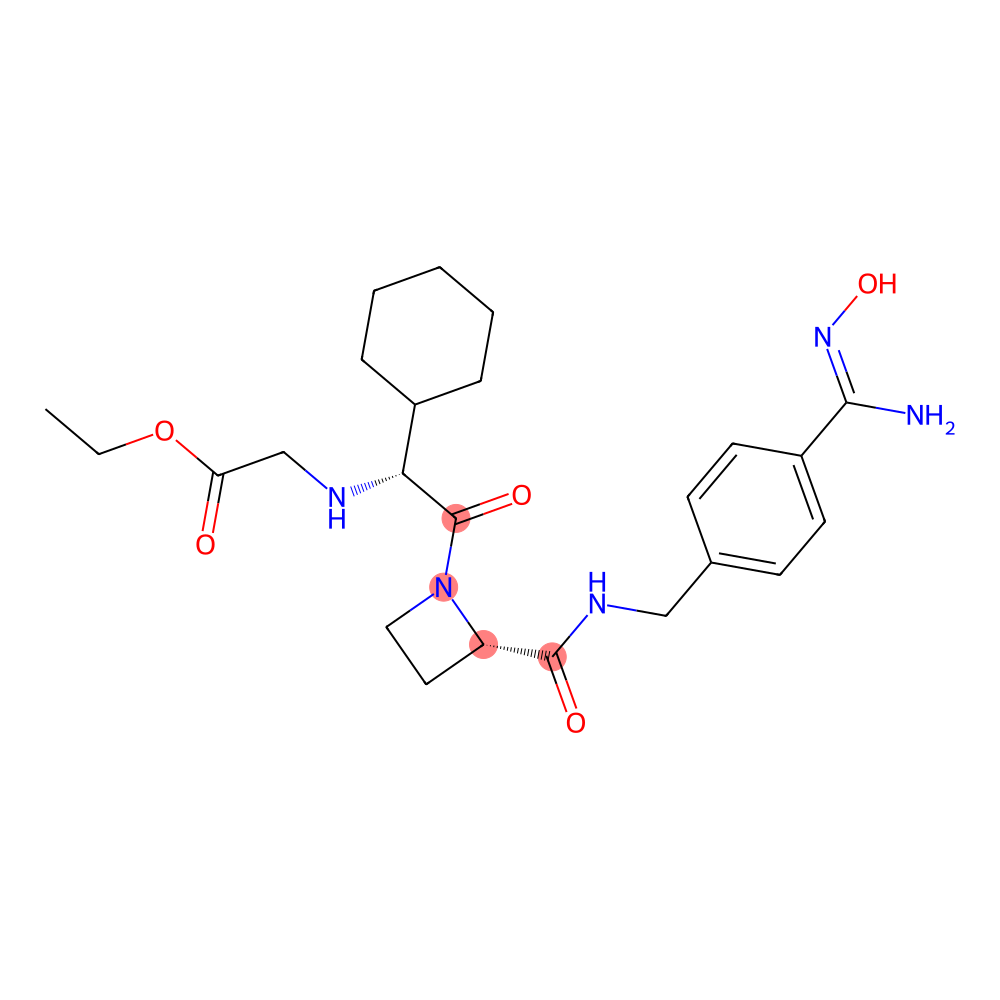

In [30]:
from IPython.display import display, Image
import os

# Assuming the rest of your setup code is already in place

for index, row in maccsshap.iterrows():
    name = row["name"]
    print(name)
    smiles = row["SMILES"]
    top_MACCS = row["topMACCS"]
    print(top_MACCS)
    
    m = Chem.MolFromSmiles(smiles)
    data = Draw.MolToImage(m, highlightAtoms=m.GetSubstructMatch(Chem.MolFromSmarts(top_MACCS)), size=(1000, 1000),
                          returnPNG=True)

    # Save the image
    image_path = f"./SHAP_molecules/{name}.png"
    data.save(image_path)
    
    # Display the image in the notebook
    if os.path.exists(image_path):
        display(Image(filename=image_path))


In [31]:
top_MACCS

'*!@*@*!@*'

In [ ]:
maccsshap_negatives= maccsshap[maccsshap.name.isin(["2-Butoxyethanol","Astaxanthin"])].reset_index(drop=True)

for index, row  in maccsshap_negatives.iterrows():
    #print(row["SMILES"])

    name = row["name"]
    print(name)
    smiles = row["SMILES"]
    top_MACCS = row["bottomMACCS"]
    print(top_MACCS)

    m = Chem.MolFromSmiles(smiles)
    data = Draw.MolToImage(m, highlightAtoms=m.GetSubstructMatch(Chem.MolFromSmarts(top_MACCS)), size=(1000, 1000),
                              returnPNG=True)
    image_path = f"./SHAP_molecules/{name}.png"
    data.save(image_path)
    
    # Display the image in the notebook
    if os.path.exists(image_path):
        display(Image(filename=image_path))

In [99]:
bottom_MACCS

'[!#6;!#1;!H0]~*~*~[!#6;!#1;!H0]'

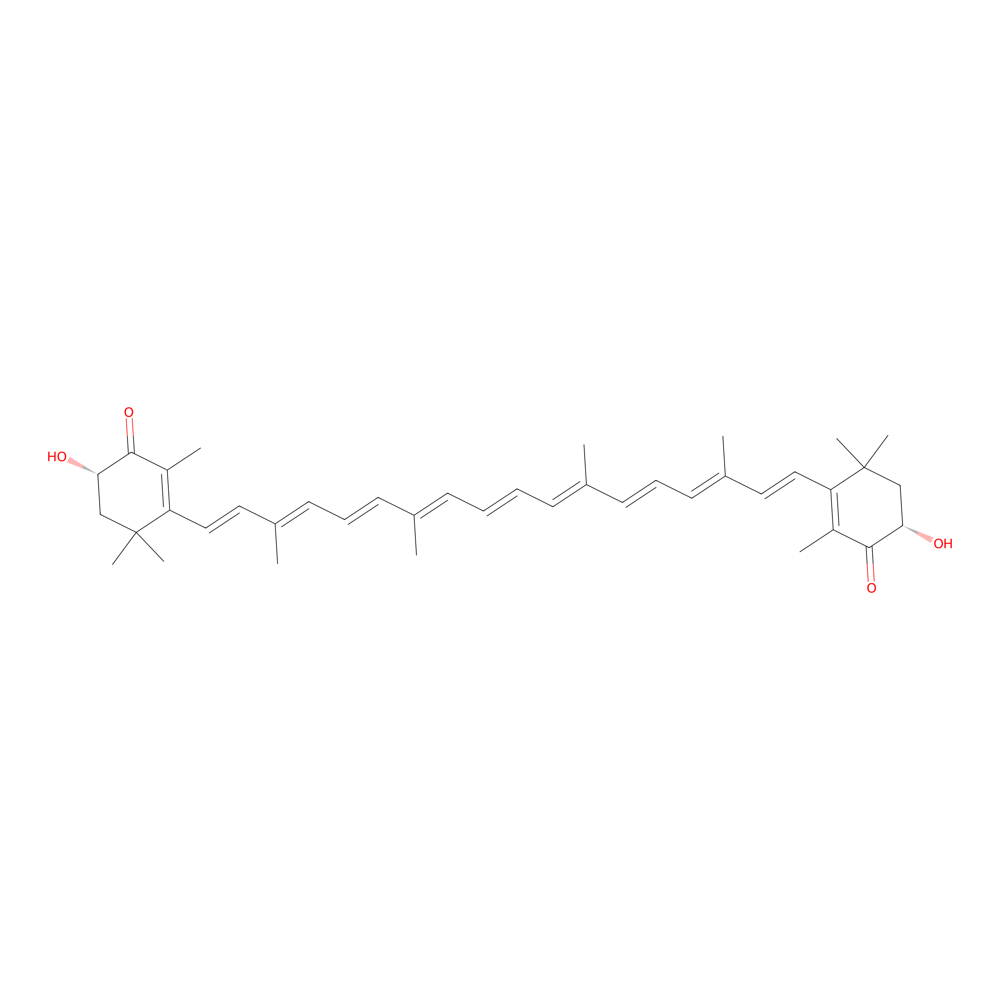

In [100]:
Draw.MolToImage(m, highlightAtoms=m.GetSubstructMatch(Chem.MolFromSmarts(bottom_MACCS)), size=(3000, 3000))  

In [101]:
#Most important MACCS feature
top[top.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]

,name,SHAP,description,value
523,MACCS150,0.002263,*!@*@*!@*,1


In [102]:
m_list=[]
target_list=[]

if (top[top.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["value"].values[0] == 1): 
    
    k = top[top.name.isin(desc.name.to_list()[-166:])]["description"].values[0]
    m = Chem.MolFromSmiles(smiles)
    
    m_list.append(m)
    target_list.append(m.GetSubstructMatches(substructure))

else:
    
    print("Absence of Substructure")
    k = top[top.name.isin(desc.name.to_list()[-166:])]["description"].values[0]
    substructure = Chem.MolFromSmarts(k)
    print(substructure)

NameError: name 'substructure' is not defined

In [ ]:
#Draw.MolsToGridImage(m_list[:1], highlightAtomLists=target_list[0], subImgSize=(300, 300), useSVG=True)

In [ ]:
substructure

In [ ]:
bottom = interpret[interpret["SHAP"]<0].sort_values(by=["SHAP"], ascending=True).reset_index(drop=True)
bottom

In [ ]:
bottom_MACCS= bottom[bottom.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["description"].values[0]
bottom_MACCS_value= bottom[bottom.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["value"].values[0]
bottom_MACCS_shap= bottom[bottom.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["SHAP"].values[0]     
bottom_MACCSsubstructure = Chem.MolFromSmarts(bottom_MACCS)

Draw.MolToImage(m, highlightAtoms=m.GetSubstructMatch(bottom_MACCSsubstructure), width=200)  


In [ ]:
Draw.MolsToGridImage([m], highlightAtomLists=[m.GetSubstructMatch(bottom_MACCSsubstructure)], subImgSize=(300, 300), useSVG=False)

In [ ]:
if (bottom[bottom.name.isin(desc.name.to_list()[-166:])].iloc[:1, :]["value"].values[0] == 1): 
    
    k = bottom[bottom.name.isin(desc.name.to_list()[-166:])]["description"].values[0]
    m = Chem.MolFromSmiles(smiles)
    substructure = Chem.MolFromSmarts(k)
    m_list.append(m)
    target_list.append(m.GetSubstructMatches(substructure))

else:
    
    print("Absence of Substructure")
    k = bottom[bottom.name.isin(desc.name.to_list()[-166:])]["description"].values[0]
    substructure = Chem.MolFromSmarts(k)
    print(substructure)

In [ ]:
Draw.MolToImage(m, highlight=substructure)

In [ ]:
Draw.MolToImage(m, highlightAtoms=m.GetSubstructMatch(substructure))

In [ ]:
m

In [ ]:
Draw.MolsToGridImage([m], highlightAtomLists=[m.GetSubstructMatch(substructure)], subImgSize=(300, 300), useSVG=True)

In [ ]:
substructure

In [ ]:
Draw.MolsToGridImage([m], subImgSize=(250,250), useSVG=True)